<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [72]</a>'.</span>

using __dna_diffusion_working_ml008__ conda enviroment  
now using the dna_diffusion_python_3_9_16  # sometjing similar

# Installs and Downloads

In [25]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [97]:
DATA_PATH = '../../../dnadiffusion/data/K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt'
NUMBER_OF_SAMPLING_TO_COMPARE_CELLS = 1000  # Or None to use everything
SAVE_MODELS_BY_EPOCH = False  # This will save a model with a different name and add the current epoch to the name
TIME_STEPS = 50

LATENT = True
LATENT_SIZE = 50
IMAGE_SIZE = 200
N_SAMPLES_TO_TEST_METRICS = 1000
EPOCHS = 10000
SAVE_AND_SAMPLE_EVERY_N_EPOCH = 50
EPOCH_LOSS_SHOW_INTERVAL = 5

# Changed
LATENT_RESNET_BLOCK_GROUPS = 2
RESNET_BLOCK_GROUPS = 4

BATCH_SIZE = 240
LIMIT_TOTAL_SEQUENCES = False  # False # OR False to use everything
VQ_VAE_MODEL_NAME = (
    '../../../dnadiffusion/data/model4cells_train_split_3_50_dims.pkl'
)
MODEL_NAME = 'model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k'
NUMBER_OF_GPUS = 8

NUCLEOTIDES = {'A': 0, 'T': 1, 'G': 2, 'C': 3}

In [27]:

%env NCCL_DEBUG=info
%env NCCL_IB_DISABLE=1
%env CUDA_LAUNCH_BLOCKING=1
%env NCCL_IB_GID_INDEX=0
%env NCCL_P2P_DISABLE=1
%env NCCL_SHM_DISABLE=1

env: NCCL_DEBUG=info
env: NCCL_IB_DISABLE=1
env: CUDA_LAUNCH_BLOCKING=1
env: NCCL_IB_GID_INDEX=0
env: NCCL_P2P_DISABLE=1
env: NCCL_SHM_DISABLE=1


# Importing

In [28]:
import os

os.getpid()
from scipy.stats import zscore
import torch
import copy
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
import torch
from IPython.display import display
import torch.nn as nn
from torchvision.utils import make_grid
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd
from tqdm import tqdm_notebook
import seaborn as sns
import matplotlib.pyplot as plt
from torch.nn.modules.activation import ReLU
from torch.optim import Adam
from tqdm import tqdm_notebook
from torchvision.utils import save_image
import matplotlib
import math
import pickle
from inspect import isfunction
from functools import partial
import scipy
from scipy.special import rel_entr
from torch import nn, einsum
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from einops import rearrange
from torch import nn, einsum
import torch.nn.functional as F
import matplotlib.animation as animation
import matplotlib.image as mpimg
import glob
from PIL import Image

%matplotlib inline
from accelerate import Accelerator

In [29]:
torch.cuda.is_initialized()

False

In [30]:
#!mamba install -c anaconda scipy -y
#!mamba install -c pytorch torchvision -y
#!conda install -c pytorch torchvision -y
#!pip install torchvision
#!mamba install -c conda-forge matplotlib -y
#!mamba install -c conda-forge pandas -y
#!mamba install -c conda-forge seaborn -y
#!mamba install -c conda-forge einops -y
# !pip install gimmemotifs    #can takes around 10 minutes
# !genomepy install hg38
#!pip install memory-efficient-attention-pytorch
#!pip install ipywidgets widgetsnbextension pandas-profiling
#!jupyter nbextension enable --py widgetsnbextension
#!mamba  install -c conda-forge jupyterlab_widgets -y
#!mamba  install -c conda-forge ipywidgets -y
#!pip install livelossplot
#!mamba install -c conda-forge accelerate -y

In [31]:
import os

# I use accelerate config on the terminal to configure the GPU and machine numbers

In [32]:
#!mamba install -c anaconda scipy -y

# Utils

In [33]:
class EMA:  # https://github.com/dome272/Diffusion-Models-pytorch/blob/main/modules.py
    def __init__(self, beta):
        super().__init__()
        self.beta = beta
        self.step = 0

    def update_model_average(self, ma_model, current_model):
        for current_params, ma_params in zip(
            current_model.parameters(), ma_model.parameters()
        ):
            old_weight, up_weight = ma_params.data, current_params.data
            ma_params.data = self.update_average(old_weight, up_weight)

    def update_average(self, old, new):
        if old is None:
            return new
        return old * self.beta + (1 - self.beta) * new

    def step_ema(self, ema_model, model, step_start_ema=2000):
        if self.step < step_start_ema:
            self.reset_parameters(ema_model, model)
            self.step += 1
            return
        self.update_model_average(ema_model, model)
        self.step += 1

    def reset_parameters(self, ema_model, model):
        ema_model.load_state_dict(model.state_dict())

In [34]:
nucleotides = ['A', 'C', 'T', 'G']


def one_hot_encode(seq, alphabet, max_seq_len):
    """One-hot encode a sequence."""
    seq_len = len(seq)
    seq_array = np.zeros((max_seq_len, len(alphabet)))
    for i in range(seq_len):
        seq_array[i, alphabet.index(seq[i])] = 1
    return seq_array


def encode(seq, alphabet):
    """Encode a sequence."""
    seq_len = len(seq)
    seq_array = np.zeros(len(alphabet))
    for i in range(seq_len):
        seq_array[alphabet.index(seq[i])] = 1

    return seq_array


def show_seq(dataloader_seq):
    for i_image in dataloader_seq:
        for image in i_image:
            image = image.numpy().reshape(4, 200)
            print(image)
            plt.rcParams["figure.figsize"] = (20, 1)
            pd_seq = pd.DataFrame(image)
            pd_seq.index = nucleotides
            sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0)
            plt.show()


class SequenceDataset(Dataset):
    'Characterizes a dataset for PyTorch'

    def __init__(self, seqs, c, transform=None):
        'Initialization'
        self.seqs = seqs
        self.c = c
        self.transform = transform

    def __len__(self):
        'Denotes the total number of samples'
        return len(self.seqs)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample
        image = self.seqs[index]

        x = self.transform(image)

        y = self.c[index]

        return x, y

In [35]:
torch.cuda.is_initialized()

False

## Motif Metric

In [36]:
def sampling_to_metric(
    number_of_samples=20,
    specific_group=False,
    group_number=None,
    cond_weight_to_metric=0,
    additional_variables=None,
):
    # Sampling regions using the trained  model
    final_sequences = []
    model_vq = None
    for n_a in tqdm_notebook(
        range(number_of_samples)
    ):  # generating number_of_samples *10 sequences
        # sampled_images = bit_diffusion.sample(batch_size = 4)
        print(n_a)
        sample_bs = 10
        if specific_group:
            sampled = torch.from_numpy(np.array([group_number] * sample_bs))
            # print ('specific')
        else:
            sampled = torch.from_numpy(np.random.choice(cell_types, sample_bs))

        #         random_classes = torch.zeros((sample_bs, TOTAL_class_number))
        #         random_classes = random_classes.scatter_(1, sampled.unsqueeze(dim=1), 1).float().cuda()
        random_classes = sampled.float()  # .cuda() to accelerate
        if additional_variables:
            random_classes = random_classes.to(additional_variables['device'])
            model_vq = additional_variables['model_vq']
        sampled_images = sample(
            classes=random_classes,
            batch_size=sample_bs,
            channels=1,
            cond_weight=cond_weight_to_metric,
            **additional_variables,
        )
        for n_b, x in enumerate(sampled_images[-1]):
            if model_vq:
                x = torch.from_numpy(x).permute(1, 0, 2)
                x = model_vq._decoder(x).cpu().detach().numpy()
            seq_final = f'>seq_test_{n_a}_{n_b}\n' + ''.join(
                [NUCLEOTIDES[s] for s in np.argmax(x.reshape(4, 200), axis=0)]
            )
            final_sequences.append(seq_final)

        ################################################################################################

        sampled_images = sample(
            classes=random_classes,
            batch_size=sample_bs,
            channels=1,
            cond_weight=cond_weight_to_metric,
            **additional_variables,
        )
        # sampled_images = sampled_images
        for n_b, x in enumerate(sampled_images[-1]):
            # x = x[-1]
            # print(x.shape)
            seq_final = f'>seq_test_{n_a}_{n_b}\n' + ''.join(
                [nucleotides[s] for s in np.argmax(x.reshape(4, 200), axis=0)]
            )
            final_sequences.append(seq_final)

    save_motifs_syn = open('synthetic_motifs.fasta', 'w')

    save_motifs_syn.write('\n'.join(final_sequences))
    save_motifs_syn.close()
    # Scan for motifs
    !gimme scan synthetic_motifs.fasta -p   JASPAR2020_vertebrates -g hg38 > syn_results_motifs.bed
    df_results_syn = pd.read_csv(
        'syn_results_motifs.bed', sep='\t', skiprows=5, header=None
    )
    df_results_syn['motifs'] = df_results_syn[8].apply(
        lambda x: x.split('motif_name "')[1].split('"')[0]
    )
    df_results_syn[0] = df_results_syn[0].apply(
        lambda x: '_'.join(x.split('_')[:-1])
    )
    df_motifs_count_syn = (
        df_results_syn[[0, 'motifs']]
        .drop_duplicates()
        .groupby('motifs')
        .count()
    )
    plt.rcParams["figure.figsize"] = (30, 2)
    df_motifs_count_syn.sort_values(0, ascending=False).head(50)[0].plot.bar()
    plt.show()

    return df_motifs_count_syn


# sampling_to_metric(10)

In [37]:
# np.random.randint(0,2)

In [38]:
# Not using the total number of motifs but the count of the occurence aka: percentage of the sequences with a given motif.
def compare_motif_list(df_motifs_a, df_motifs_b):
    # Using KL divergence to compare motifs lists distribution
    set_all_mot = set(
        df_motifs_a.index.values.tolist() + df_motifs_b.index.values.tolist()
    )
    create_new_matrix = []
    for x in set_all_mot:
        list_in = []
        list_in.append(x)  # adding the name
        if x in df_motifs_a.index:
            list_in.append(df_motifs_a.loc[x][0])
        else:
            list_in.append(1)

        if x in df_motifs_b.index:
            list_in.append(df_motifs_b.loc[x][0])
        else:
            list_in.append(1)

        create_new_matrix.append(list_in)

    df_motifs = pd.DataFrame(
        create_new_matrix, columns=['motif', 'motif_a', 'motif_b']
    )

    df_motifs['Diffusion_seqs'] = (
        df_motifs['motif_a'] / df_motifs['motif_a'].sum()
    )
    df_motifs['Training_seqs'] = (
        df_motifs['motif_b'] / df_motifs['motif_b'].sum()
    )
    plt.rcParams["figure.figsize"] = (3, 3)
    sns.regplot(x='Diffusion_seqs', y='Training_seqs', data=df_motifs)
    plt.xlabel('Diffusion Seqs')
    plt.ylabel('Training Seqs')
    plt.title('Motifs Probs')
    plt.show()

    display(df_motifs)
    kl_pq = rel_entr(
        df_motifs['Diffusion_seqs'].values, df_motifs['Training_seqs'].values
    )
    return np.sum(kl_pq)


# compare_motif_list(synt_df, df_results_seq_guime_count)

# VQ-VAE


In [42]:
class VectorQuantizer(nn.Module):
    """
    An implementation of a vector quantizer, as described in 'Neural Discrete Representation Learning'
    (https://arxiv.org/abs/1711.00937) by van den Oord et al.

    This module can be used as a layer in a neural network to quantize the activations of the previous
    layer. During training, the quantization loss is backpropagated through this module, and the
    quantization vectors are learned.

    Args:
        num_embeddings (int): The number of quantization vectors, i.e. the number of possible values
            that each activation can take.
        embedding_dim (int): The length of each quantization vector. This should match the number of
            channels of the activations that will be quantized.
        commitment_cost (float): The weighting factor that determines the trade-off between the
            quantization loss and the commitment loss. Larger values means that the quantization vectors
            will be pushed closer to their "optimal" values, but at the expense of a higher quantization
            loss.

    Inputs:
        - inputs (torch.Tensor): The activations to be quantized, with shape (batch_size, channels,
            height, width).

    Outputs:
        - loss (torch.Tensor): The quantization loss, a scalar value.
        - quantized (torch.Tensor): The quantized activations, with the same shape as the inputs.
        - perplexity (torch.Tensor): The perplexity of the encodings, a scalar value.
        - encodings (torch.Tensor): The encodings for the inputs, with shape (batch_size,
            num_embeddings).
        - encoding_indices (torch.Tensor): The indices of the encodings in the quantization vector
            space, with shape (batch_size, 1).
    """

    def __init__(self, num_embeddings, embedding_dim, commitment_cost):
        super(VectorQuantizer, self).__init__()

        self._embedding_dim = embedding_dim
        self._num_embeddings = num_embeddings

        self._embedding = nn.Embedding(
            self._num_embeddings, self._embedding_dim
        )
        self._embedding.weight.data.uniform_(
            -1 / self._num_embeddings, 1 / self._num_embeddings
        )
        self._commitment_cost = commitment_cost

    def forward(self, inputs):
        # convert inputs from BCHW -> BHWC
        inputs = inputs.permute(0, 2, 3, 1).contiguous()
        input_shape = inputs.shape

        # Flatten input
        flat_input = inputs.view(-1, self._embedding_dim)

        # Calculate distances
        distances = (
            torch.sum(flat_input**2, dim=1, keepdim=True)
            + torch.sum(self._embedding.weight**2, dim=1)
            - 2 * torch.matmul(flat_input, self._embedding.weight.t())
        )

        # Encoding
        encoding_indices = torch.argmin(distances, dim=1).unsqueeze(1)
        encodings = torch.zeros(
            encoding_indices.shape[0],
            self._num_embeddings,
            device=inputs.device,
        )
        encodings.scatter_(1, encoding_indices, 1)

        # Quantize and unflatten
        quantized = torch.matmul(encodings, self._embedding.weight).view(
            input_shape
        )

        # Loss
        e_latent_loss = F.mse_loss(quantized.detach(), inputs)
        q_latent_loss = F.mse_loss(quantized, inputs.detach())
        loss = q_latent_loss + self._commitment_cost * e_latent_loss

        quantized = inputs + (quantized - inputs).detach()
        avg_probs = torch.mean(encodings, dim=0)
        perplexity = torch.exp(
            -torch.sum(avg_probs * torch.log(avg_probs + 1e-10))
        )

        # convert quantized from BHWC -> BCHW
        return (
            loss,
            quantized.permute(0, 3, 1, 2).contiguous(),
            perplexity,
            encodings,
            encoding_indices,
        )


class VectorQuantizerEMA(nn.Module):
    """
    An implementation of a vector quantizer, with an exponential moving average (EMA) update rule
    for the quantization vectors. This module can be used as a layer in a neural network to quantize
    the activations of the previous layer. During training, the quantization loss is backpropagated
    through this module, and the quantization vectors are learned using the EMA update rule.

    Args:
        num_embeddings (int): The number of quantization vectors, i.e. the number of possible values
            that each activation can take.
        embedding_dim (int): The length of each quantization vector. This should match the number of
            channels of the activations that will be quantized.
        commitment_cost (float): The weighting factor that determines the trade-off between the
            quantization loss and the commitment loss. Larger values means that the quantization vectors
            will be pushed closer to their "optimal" values, but at the expense of a higher quantization
            loss.
        decay (float): The decay rate for the exponential moving average.
        epsilon (float): A small constant value added to the cluster size to avoid division by zero.

    Inputs:
        - inputs (torch.Tensor): The activations to be quantized, with shape (batch_size, channels,
            height, width).

    Outputs:
        - loss (torch.Tensor): The quantization loss, a scalar value.
        - quantized (torch.Tensor): The quantized activations, with the same shape as the inputs.
        - perplexity (torch.Tensor): The perplexity of the encodings, a scalar value.
        - encodings (torch.Tensor): The encodings for the inputs, with shape (batch_size,
            num_embeddings).
        - encoding_indices (torch.Tensor): The indices of the encodings in the quantization vector
            space, with shape (batch_size, 1).
    """

    def __init__(
        self,
        num_embeddings,
        embedding_dim,
        commitment_cost,
        decay,
        epsilon=1e-5,
    ):
        super(VectorQuantizerEMA, self).__init__()

        self._embedding_dim = embedding_dim
        self._num_embeddings = num_embeddings

        self._embedding = nn.Embedding(
            self._num_embeddings, self._embedding_dim
        )
        self._embedding.weight.data.normal_()
        self._commitment_cost = commitment_cost

        self.register_buffer('_ema_cluster_size', torch.zeros(num_embeddings))
        self._ema_w = nn.Parameter(
            torch.Tensor(num_embeddings, self._embedding_dim)
        )
        self._ema_w.data.normal_()

        self._decay = decay
        self._epsilon = epsilon

    def forward(self, inputs):
        # convert inputs from BCHW -> BHWC
        inputs = inputs.permute(0, 2, 3, 1).contiguous()
        input_shape = inputs.shape

        # Flatten input
        flat_input = inputs.view(-1, self._embedding_dim)

        # Calculate distances
        distances = (
            torch.sum(flat_input**2, dim=1, keepdim=True)
            + torch.sum(self._embedding.weight**2, dim=1)
            - 2 * torch.matmul(flat_input, self._embedding.weight.t())
        )

        # Encoding
        encoding_indices = torch.argmin(distances, dim=1).unsqueeze(1)
        encodings = torch.zeros(
            encoding_indices.shape[0],
            self._num_embeddings,
            device=inputs.device,
        )
        encodings.scatter_(1, encoding_indices, 1)

        # Quantize and unflatten
        quantized = torch.matmul(encodings, self._embedding.weight).view(
            input_shape
        )

        # Use EMA to update the embedding vectors
        if self.training:
            self._ema_cluster_size = self._ema_cluster_size * self._decay + (
                1 - self._decay
            ) * torch.sum(encodings, 0)

            # Laplace smoothing of the cluster size
            n = torch.sum(self._ema_cluster_size.data)
            self._ema_cluster_size = (
                (self._ema_cluster_size + self._epsilon)
                / (n + self._num_embeddings * self._epsilon)
                * n
            )

            dw = torch.matmul(encodings.t(), flat_input)
            self._ema_w = nn.Parameter(
                self._ema_w * self._decay + (1 - self._decay) * dw
            )

            self._embedding.weight = nn.Parameter(
                self._ema_w / self._ema_cluster_size.unsqueeze(1)
            )

        # Loss
        e_latent_loss = F.mse_loss(quantized.detach(), inputs)
        loss = self._commitment_cost * e_latent_loss

        # Straight Through Estimator
        quantized = inputs + (quantized - inputs).detach()
        avg_probs = torch.mean(encodings, dim=0)
        perplexity = torch.exp(
            -torch.sum(avg_probs * torch.log(avg_probs + 1e-10))
        )

        # convert quantized from BHWC -> BCHW
        return (
            loss,
            quantized.permute(0, 3, 1, 2).contiguous(),
            perplexity,
            encodings,
            encoding_indices,
        )


class Residual(nn.Module):
    """
    A residual block, as described in the paper 'Deep Residual Learning for Image Recognition'
    (https://arxiv.org/abs/1512.03385) by He et al. This block consists of two convolutional layers
    with ReLU activation, followed by a residual connection that adds the input to the output of the
    block.

    Args:
        in_channels (int): The number of channels in the input.
        num_hiddens (int): The number of channels in the output.
        num_residual_hiddens (int): The number of channels in the intermediate outputs of the block.

    Inputs:
        - x (torch.Tensor): The input tensor with shape (batch_size, in_channels, height, width).

    Outputs:
        - y (torch.Tensor): The output tensor with shape (batch_size, num_hiddens, height, width).
    """

    def __init__(self, in_channels, num_hiddens, num_residual_hiddens):
        super(Residual, self).__init__()
        self._block = nn.Sequential(
            nn.ReLU(True),
            nn.Conv2d(
                in_channels=in_channels,
                out_channels=num_residual_hiddens,
                kernel_size=3,
                stride=1,
                padding=1,
                bias=False,
            ),
            nn.ReLU(True),
            nn.Conv2d(
                in_channels=num_residual_hiddens,
                out_channels=num_hiddens,
                kernel_size=1,
                stride=1,
                bias=False,
            ),
        )

    def forward(self, x):
        return x + self._block(x)


class ResidualStack(nn.Module):
    """
    A stack of residual blocks, as described in the paper 'Deep Residual Learning for Image
    Recognition' (https://arxiv.org/abs/1512.03385) by He et al. This stack consists of a specified
    number of residual blocks, each with the same number of channels in the input and output, and the
    same number of channels in the intermediate outputs.

    Args:
        in_channels (int): The number of channels in the input to the stack.
        num_hiddens (int): The number of channels in the output from the stack.
        num_residual_layers (int): The number of residual blocks in the stack.
        num_residual_hiddens (int): The number of channels in the intermediate outputs of each block.

    Inputs:
        - x (torch.Tensor): The input tensor with shape (batch_size, in_channels, height, width).

    Outputs:
        - y (torch.Tensor): The output tensor with shape (batch_size, num_hiddens, height, width).
    """

    def __init__(
        self,
        in_channels,
        num_hiddens,
        num_residual_layers,
        num_residual_hiddens,
    ):
        super(ResidualStack, self).__init__()
        self._num_residual_layers = num_residual_layers
        self._layers = nn.ModuleList(
            [
                Residual(in_channels, num_hiddens, num_residual_hiddens)
                for _ in range(self._num_residual_layers)
            ]
        )

    def forward(self, x):
        for i in range(self._num_residual_layers):
            x = self._layers[i](x)
        return F.relu(x)


class Encoder(nn.Module):
    def __init__(
        self,
        in_channels,
        num_hiddens,
        num_residual_layers,
        num_residual_hiddens,
    ):
        super(Encoder, self).__init__()

        self._conv_1 = nn.Conv2d(
            in_channels=in_channels,
            out_channels=num_hiddens // 2,
            kernel_size=(4, 10),
            stride=2,
            padding=(1, 4),
        )
        self._conv_2 = nn.Conv2d(
            in_channels=num_hiddens // 2,
            out_channels=num_hiddens,
            kernel_size=4,
            stride=2,
            padding=1,
        )
        self._conv_3 = nn.Conv2d(
            in_channels=num_hiddens,
            out_channels=num_hiddens,
            kernel_size=3,
            stride=1,
            padding=1,
        )
        self._residual_stack = ResidualStack(
            in_channels=num_hiddens,
            num_hiddens=num_hiddens,
            num_residual_layers=num_residual_layers,
            num_residual_hiddens=num_residual_hiddens,
        )

    def forward(self, inputs):
        x = self._conv_1(inputs)
        x = F.relu(x)
        x = self._conv_2(x)
        x = F.relu(x)

        x = self._conv_3(x)
        return self._residual_stack(x)


class Decoder(nn.Module):
    """
    Decoder is a PyTorch module that takes the quantized latent representations and decodes them
    into the original input space. It consists of a sequence of convolutional and deconvolutional layers
    followed by a residual stack.

    Args:
        in_channels (int): The number of channels in the input tensor.
        num_hiddens (int): The number of channels in the hidden layers of the decoder.
        num_residual_layers (int): The number of residual layers in the decoder.
        num_residual_hiddens (int): The number of channels in the intermediate outputs of the residual
            blocks in the decoder.

    Inputs:
        - inputs (torch.Tensor): The input tensor with shape (B, in_channels, H, W), where B is the
            batch size, in_channels is the number of channels in the input, and H and W are the height
            and width of the tensor.

    Outputs:
        - x (torch.Tensor): The output tensor with shape (B, 1, H', W'), where H' and W' are the height
            and width of the decoded tensor, respectively.
    """

    def __init__(
        self,
        in_channels,
        num_hiddens,
        num_residual_layers,
        num_residual_hiddens,
    ):
        super(Decoder, self).__init__()

        self._conv_1 = nn.Conv2d(
            in_channels=in_channels,
            out_channels=num_hiddens,
            kernel_size=3,
            stride=1,
            padding=1,
        )

        self._residual_stack = ResidualStack(
            in_channels=num_hiddens,
            num_hiddens=num_hiddens,
            num_residual_layers=num_residual_layers,
            num_residual_hiddens=num_residual_hiddens,
        )

        self._conv_trans_1 = nn.ConvTranspose2d(
            in_channels=num_hiddens,
            out_channels=num_hiddens // 2,
            kernel_size=4,
            stride=2,
            padding=1,
        )

        self._conv_trans_2 = nn.ConvTranspose2d(
            in_channels=num_hiddens // 2,
            out_channels=1,
            kernel_size=(2, 12),
            stride=2,
            padding=(0, 5),
        )

    def forward(self, inputs):
        x = self._conv_1(inputs)

        x = self._residual_stack(x)

        x = self._conv_trans_1(x)
        x = F.relu(x)

        return self._conv_trans_2(x)


class Model(nn.Module):
    """
    Model is a PyTorch module for the VQ-VAE model described in the paper 'Neural Discrete
    Representation Learning' (https://arxiv.org/abs/1711.00937) by van den Oord et al. It consists of
    an encoder, a vector quantization module, and a decoder. The vector quantization module can be
    either a VectorQuantizer or a VectorQuantizerEMA, depending on the value of the decay argument.

    Args:
        num_hiddens (int): The number of channels in the hidden layers of the encoder and decoder.
        num_residual_layers (int): The number of residual layers in the encoder and decoder.
        num_residual_hiddens (int): The number of channels in the intermediate outputs of the residual
            blocks in the encoder and decoder.
        num_embeddings (int): The number of embeddings in the vector quantization module.
        embedding_dim (int): The dimension of the embedding vectors in the vector quantization module.
        commitment_cost (float): The commitment cost, which controls the balance between reconstruction
            loss and the commitment to the learned codebook.
        decay (float, optional): The decay rate of the moving average used in the vector quantization
            module. If 0, then the vector quantization module is not EMA-enabled.

    Inputs:
        - x (torch.Tensor): The input tensor
    """

    def __init__(
        self,
        num_hiddens,
        num_residual_layers,
        num_residual_hiddens,
        num_embeddings,
        embedding_dim,
        commitment_cost,
        decay=0,
    ):
        super(Model, self).__init__()

        self._encoder = Encoder(
            1, num_hiddens, num_residual_layers, num_residual_hiddens
        )
        self._pre_vq_conv = nn.Conv2d(
            in_channels=num_hiddens,
            out_channels=embedding_dim,
            kernel_size=1,
            stride=1,
        )
        if decay > 0.0:
            self._vq_vae = VectorQuantizerEMA(
                num_embeddings, embedding_dim, commitment_cost, decay
            )
        else:
            self._vq_vae = VectorQuantizer(
                num_embeddings, embedding_dim, commitment_cost
            )
        self._decoder = Decoder(
            embedding_dim,
            num_hiddens,
            num_residual_layers,
            num_residual_hiddens,
        )

    def forward(self, x):
        z = self._encoder(x)
        # print("1", z.shape)
        z = self._pre_vq_conv(z)
        # print("2", z.shape)
        loss, quantized, perplexity, _, encoding_index = self._vq_vae(z)
        # print("3", quantized.shape)
        x_recon = self._decoder(quantized)
        # print("4", x_recon.shape)
        return loss, x_recon, perplexity, quantized, encoding_index

In [52]:
def one_hot_encode_sequences(seq, include_n=False):
    """
    Converts a sequence of nucleotides to a one-hot encoded tensor.

    Args:
        seq (str): The sequence of nucleotides to encode.
        include_n (bool, optional): Whether to include 'N' nucleotides in the encoding.

    Returns:
        torch.Tensor: The one-hot encoded tensor, with shape (sequence_length, 4).
    """
    NUCLEOTIDES = {'A': 0, 'T': 1, 'G': 2, 'C': 3}
    num_seq = []
    for nucleotide in seq:
        num_seq.append(NUCLEOTIDES[nucleotide])
    return (
        F.one_hot(
            torch.tensor(num_seq).to(torch.int64), num_classes=len(NUCLEOTIDES)
        )
    ).T


class PeaksDataset(Dataset):
    """
    PeaksDataset is a PyTorch dataset for representing sequences of nucleotides. It takes a DataFrame
    as input, one-hot encodes the raw sequences, and accumulates them into a list of tensors.

    Args:
        df (pandas.DataFrame): The DataFrame containing the raw sequences.

    Inputs:
        - idx (int): The index of the sequence to return.

    Outputs:
        - x (torch.Tensor): The one-hot encoded sequence, with shape (1, sequence_length, 4).
        - y (int): The target label, which is always set to 1 in this dataset.
    """

    def __init__(self, df):
        self.sequences = []
        for curr_seq in df['raw_sequence'].tolist():
            if len(curr_seq) != 200:
                mid_index = len(curr_seq) // 2
                curr_seq = curr_seq[mid_index - 100 : mid_index + 100]
            one_hot_representation = one_hot_encode_sequences(curr_seq)
            if one_hot_representation is not None:
                one_hot_representation = one_hot_representation[None, :, :]
                self.sequences.append(one_hot_representation)

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], 1

In [53]:
# Load the vq-vae model
train_data_quantized = None
with open(VQ_VAE_MODEL_NAME, 'rb') as f:
    model_vq = pickle.load(f)

train_df = pd.read_csv(
    "../../../dnadiffusion/data/K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt",
    delim_whitespace=True,
)
train_df = train_df[train_df.data_label == 'training']
train_df["raw_sequence"] = train_df["sequence"]
peaks_data = PeaksDataset(train_df)
peaks_dl = DataLoader(peaks_data, batch_size=train_df.shape[0], shuffle=False)

for original_train_data, _ in peaks_dl:
    # Convert the original validation data to a float tensor
    original_train_data = original_train_data.float()
    # Apply the encoder and pre-VQ-convolution layers of the model to the original validation data
    vq_output = model_vq._pre_vq_conv(model_vq._encoder(original_train_data))
    # Apply the VQ-VAE layers of the model_vq to the VQ output and extract the quantized data
    _, train_data_quantized, _, _, _ = model_vq._vq_vae(vq_output)
    # Apply the decoder of the model_vq to the quantized data to obtain the reconstructed data
    reconstructed_train_data = model_vq._decoder(train_data_quantized)
    # Extract the ground truth labels from the original validation data
    ground_truth = torch.argmax(original_train_data, dim=2)
    # Extract the predicted labels from the reconstructed data
    prediction = torch.argmax(reconstructed_train_data, dim=2)

# Diffusion

In [54]:
# modified 1/20/23
from functools import partial


# ALL THIS FUNCTIONS CHANGED WITH THE CONDITIONAL CODE
@torch.no_grad()
def p_sample(model, x, t, t_index):
    betas_t = extract(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    # print (x.shape, 'x_shape')
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)

    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, time=t) / sqrt_one_minus_alphas_cumprod_t
    )

    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise


@torch.no_grad()
def p_sample_guided(
    model,
    x,
    classes,
    t,
    t_index,
    context_mask,
    cond_weight=0.0,
    betas=None,
    sqrt_one_minus_alphas_cumprod=None,
    sqrt_recip_alphas=None,
    posterior_variance=None,
    device=None,
    accelerator=None,
):
    # adapted from: https://openreview.net/pdf?id=qw8AKxfYbI
    # print (classes[0])
    batch_size = x.shape[0]
    # double to do guidance with
    t_double = t.repeat(2).to(device)
    x_double = x.repeat(2, 1, 1, 1).to(device)
    betas = betas.to(device)
    sqrt_one_minus_alphas_cumprod = sqrt_one_minus_alphas_cumprod.to(device)
    betas_t = extract(betas, t_double, x_double.shape, device=device)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t_double, x_double.shape, device=device
    )
    sqrt_recip_alphas_t = extract(
        sqrt_recip_alphas, t_double, x_double.shape, device=device
    )

    # classifier free sampling interpolates between guided and non guided using `cond_weight`
    classes_masked = classes * context_mask
    classes_masked = classes_masked.type(torch.long)
    # print ('class masked', classes_masked)
    if accelerator:
        model = accelerator.unwrap_model(model)
    model.output_attention = True
    show_out_test = model(x_double, time=t_double, classes=classes_masked)
    # print(x_double.shape, t_double.shape, 'x_double and t_double')
    # print (show_out_test.shape, 'show_out_test')
    # print (show_out_test)
    # print (show_out_test[0])
    # print (show_out_test[1])
    # print (show_out_test[2])
    # print (show_out_test[3])
    preds, cross_map_full = model(
        x_double, time=t_double, classes=classes_masked
    )  # I added cross_map
    model.output_attention = False
    cross_map = cross_map_full[:batch_size]
    eps1 = (1 + cond_weight) * preds[:batch_size]
    eps2 = cond_weight * preds[batch_size:]
    x_t = eps1 - eps2

    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t[:batch_size] * (
        x
        - betas_t[:batch_size]
        * x_t
        / sqrt_one_minus_alphas_cumprod_t[:batch_size]
    )

    if t_index == 0:
        return model_mean, cross_map
    else:
        posterior_variance_t = extract(
            posterior_variance, t, x.shape, device=device
        )
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise, cross_map


# Algorithm 2 but save all images:
@torch.no_grad()
def p_sample_loop(
    model,
    classes,
    shape,
    cond_weight,
    get_cross_map=False,
    timesteps=None,
    device=None,
    betas=None,
    sqrt_one_minus_alphas_cumprod=None,
    sqrt_recip_alphas=None,
    posterior_variance=None,
    accelerator=None,
):  # to accelerate add timesteps
    # device = next(model.parameters()).device # to accelerate

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn(shape, device=device)  # to accelerate
    imgs = []
    cross_images_final = []

    if classes is not None:
        n_sample = classes.shape[0]
        context_mask = torch.ones_like(classes).to(device)
        # make 0 index unconditional
        # double the batch
        classes = classes.repeat(2)
        context_mask = context_mask.repeat(2)
        context_mask[n_sample:] = 0.0  # makes second half of batch context free
        sampling_fn = partial(
            p_sample_guided,
            classes=classes,
            cond_weight=cond_weight,
            context_mask=context_mask,
            betas=betas,
            device=device,
            sqrt_one_minus_alphas_cumprod=sqrt_one_minus_alphas_cumprod,
            sqrt_recip_alphas=sqrt_recip_alphas,
            posterior_variance=posterior_variance,
            accelerator=accelerator,
        )  # to accelerate betas
    else:
        sampling_fn = partial(p_sample)

    for i in tqdm(
        reversed(range(0, timesteps)),
        desc='sampling loop time step',
        total=timesteps,
    ):
        img, cross_matrix = sampling_fn(
            model,
            x=img,
            t=torch.full((b,), i, device=device, dtype=torch.long),
            t_index=i,
        )
        imgs.append(img.cpu().numpy())
        cross_images_final.append(cross_matrix.cpu().numpy())
    if get_cross_map:
        return imgs, cross_images_final
    else:
        return imgs


print('1')

shape_size = 4
if LATENT:
    shape_size = 3


@torch.no_grad()
def sample(
    model,
    image_size,
    classes=None,
    batch_size=16,
    channels=3,
    cond_weight=0,
    get_cross_map=False,
    timesteps=None,
    device=None,
    betas=None,
    sqrt_one_minus_alphas_cumprod=None,
    sqrt_recip_alphas=None,
    posterior_variance=None,
    accelerator=None,
):  # to accelerate add timesteps, device , betas
    return p_sample_loop(
        model,
        classes=classes,
        shape=(batch_size, channels, shape_size, image_size),
        cond_weight=cond_weight,
        get_cross_map=get_cross_map,
        timesteps=timesteps,
        device=device,
        betas=betas,
        sqrt_one_minus_alphas_cumprod=sqrt_one_minus_alphas_cumprod,
        sqrt_recip_alphas=sqrt_recip_alphas,
        posterior_variance=posterior_variance,
        accelerator=accelerator,
    )  # to accelerate add timesteps device

1


In [55]:
torch.cuda.is_initialized()

False

### schedule

In [56]:
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = (
        torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    )
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)


def linear_beta_schedule(timesteps, beta_end=0.005):
    beta_start = 0.0001

    return torch.linspace(beta_start, beta_end, timesteps)


def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2


def sigmoid_beta_schedule(timesteps):
    beta_start = 0.001
    beta_end = 0.02
    betas = torch.linspace(-6, 6, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

### Foward diffusion


In [57]:
# forward diffusion
def q_sample(
    x_start,
    t,
    sqrt_alphas_cumprod,
    sqrt_one_minus_alphas_cumprod,
    noise=None,
    device=None,
):
    if noise is None:
        noise = torch.randn_like(x_start)

    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape).to(
        device
    )
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x_start.shape
    ).to(device)

    # print  (sqrt_alphas_cumprod_t , sqrt_one_minus_alphas_cumprod_t , t)
    # print (sqrt_alphas_cumprod_t.device, 'sqrt_alphas_cumprod_t')
    # print (x_start.device, 'x_start' )
    # print (sqrt_one_minus_alphas_cumprod_t.device , 'sqrt_one_minus_alphas_cumprod_t')
    # print (noise.device , 'noise.device')
    return (
        sqrt_alphas_cumprod_t * x_start
        + sqrt_one_minus_alphas_cumprod_t * noise
    )

In [58]:
torch.cuda.is_initialized()

False

In [59]:
torch.bernoulli(torch.zeros(10) + (1 - 0.1)).device

device(type='cpu')

### Loss

In [60]:
# THIS function changed to accomodate the conditional


def p_losses(
    denoise_model,
    x_start,
    t,
    classes,
    noise=None,
    loss_type="l1",
    p_uncond=0.1,
    sqrt_alphas_cumprod_in=None,
    sqrt_one_minus_alphas_cumprod_in=None,
    device=None,
):
    # device = x_start.device # to accelerate
    if noise is None:
        noise = torch.randn_like(x_start)  #  guass noise
    x_noisy = q_sample(
        x_start=x_start,
        t=t,
        sqrt_alphas_cumprod=sqrt_alphas_cumprod_in,
        sqrt_one_minus_alphas_cumprod=sqrt_one_minus_alphas_cumprod_in,
        noise=noise,
        device=device,
    )  # this is the auto generated noise given t and Noise
    # print('max_q_sample', x_noisy.max(), 'mean_q_sample',x_noisy.mean() )

    context_mask = torch.bernoulli(
        torch.zeros(classes.shape[0]) + (1 - p_uncond)
    ).to(device)
    # print ('context mask', context_mask)
    # print ('classes', classes)

    # mask for unconditinal guidance
    classes = classes * context_mask
    # nn.Embedding needs type to be long, multiplying with mask changes type
    classes = classes.type(torch.long)
    # print ('final class',classes )
    predicted_noise = denoise_model(
        x_noisy, t, classes
    )  # this is the predicted noise given the model and step t
    # print('max_predicted', x_noisy.max(), 'mean_predicted',x_noisy.mean() )

    # #predicted is ok (clipped)
    # print ('predited inside loss')
    # print (predicted_noise)
    # print ('this is the noise generated by the p_losses')
    # print (noise)
    if loss_type == 'l1':
        loss = F.l1_loss(noise, predicted_noise)
    elif loss_type == 'l2':
        # print (noise.shape, 'noise' )
        # print (predicted_noise.shape, 'pred')
        loss = F.mse_loss(noise, predicted_noise)
    elif loss_type == "huber":
        loss = F.smooth_l1_loss(noise, predicted_noise)
    else:
        raise NotImplementedError()

    return loss

# Models

In [61]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        # device = time.device # to accelerate
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        # embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings) # to accelerate
        embeddings = torch.exp(torch.arange(half_dim) * -embeddings)

        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class ResBlock(nn.Module):

    """
    Iniialize a residual block with two convolutions followed by batchnorm layers
    """

    def __init__(self, in_size: int, hidden_size: int, out_size: int):
        super().__init__()
        self.conv1 = nn.Conv2d(in_size, hidden_size, 3, padding=1)
        self.conv2 = nn.Conv2d(hidden_size, out_size, 3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(hidden_size)
        self.batchnorm2 = nn.BatchNorm2d(out_size)

    def convblock(self, x):
        x = F.relu(self.batchnorm1(self.conv1(x)))
        x = F.relu(self.batchnorm2(self.conv2(x)))
        return x

    """
    Combine output with the original input
    """

    def forward(self, x):
        return x + self.convblock(x)  # skip connection


class ConvBlock_2d(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, padding=2),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 4, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.zeros_(m.bias)

    def forward(self, x):
        # print ('x', x.shape)
        x = self.conv1(x)
        # print ('conv1', x.shape)
        x = self.conv2(x)
        # print ('conv2', x.shape)
        # x = F.avg_pool2d(x, 2)

        return x


class Classifier(nn.Module):
    def __init__(self):
        super().__init__()

        self.res = nn.Sequential(
            ResBlock(1, 2, 1),
            ResBlock(1, 2, 1),
            ResBlock(1, 2, 1),
            ResBlock(1, 2, 1),
        )

        self.conv = nn.Sequential(
            ConvBlock_2d(in_channels=1, out_channels=2),
            nn.ReLU(),
            nn.BatchNorm2d(2),
            ConvBlock_2d(in_channels=2, out_channels=4),
            nn.ReLU(),
            nn.BatchNorm2d(4),
            ConvBlock_2d(in_channels=4, out_channels=1),
            nn.BatchNorm2d(1)
            # ConvBlock_2d(in_channels=1, out_channels=1),
            # ConvBlock_2d(in_channels=1, out_channels=1),
            # ConvBlock_2d(in_channels=1, out_channels=1),
        )

        self.fc = nn.Sequential(
            nn.Linear(800, 800),
            # nn.GELU(),
            nn.BatchNorm1d(
                800
            ),  # ALWAYS BATCHNORM THIS CHANGES A LOT THE RESULTS
            # nn.Linear(400, 400),
            # nn.BatchNorm1d(400),
            # nn.GELU(),
            # nn.BatchNorm1d(400),
        )

        self.fc2 = nn.Sequential(
            nn.Linear(400, 800),
            # nn.GELU(),
            nn.BatchNorm1d(
                800
            ),  # ALWAYS BATCHNORM THIS CHANGES A LOT THE RESULTS
            # nn.Linear(400, 400),
            # nn.GELU(),
            # nn.BatchNorm1d(400),
        )

        time_dim = 200 * 4
        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(100),
            nn.Linear(100, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

        self.time_mlp_out = nn.Sequential(
            SinusoidalPositionEmbeddings(100),
            nn.Linear(100, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

    def forward(self, x, y):
        # print (x.shape, 'inside model x ')
        x_a = x.clone()
        # y_a = y.clone()
        x = self.res(x)

        # print ('to_full', x.shape)

        y_emb = self.time_mlp(y)
        # y_emb_out = self.time_mlp_out(y_a)

        x = x.view(-1, 800)

        x_a = x.view(-1, 800)
        x_a = self.fc(x_a)

        x = x + y_emb.view(-1, 800) * x_a

        # x = self.fc2(x)
        # x = x + y_emb_out.view(-1,400) + x_a

        # x = torch.clip(x, min=-1, max=1)
        x = x.view(-1, 1, 4, 200)

        # x = x.view(-1,1,200,4)

        # print (x.shape)
        # The cliping is working already checked
        return x

In [62]:
torch.cuda.is_initialized()

False

### UNET and UTILS

In [63]:
# THIS is a new function  to accomodate the conditional


class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        '''
        generic one layer FC NN for embedding things  
        '''
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [64]:
# This session changed a lot to accomodate the conditional generation
from memory_efficient_attention_pytorch import Attention as EfficientAttention


def exists(x):
    return x is not None


def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d


def cycle(dl):
    while True:
        for data in dl:
            yield data


def has_int_squareroot(num):
    return (math.sqrt(num) ** 2) == num


def num_to_groups(num, divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr


def convert_image_to(img_type, image):
    if image.mode != img_type:
        return image.convert(img_type)
    return image


def l2norm(t):
    return F.normalize(t, dim=-1)


# small helper modules


def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d


class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x


def Upsample(dim, dim_out=None, kernel_upsample=3):
    return nn.Sequential(
        nn.Upsample(scale_factor=2, mode='nearest'),
        nn.Conv2d(dim, default(dim_out, dim), kernel_upsample, padding=1),
    )


def Downsample(dim, dim_out=None):
    return nn.Conv2d(dim, default(dim_out, dim), 4, 2, 1)


class LayerNorm(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.g = nn.Parameter(torch.ones(1, dim, 1, 1))

    def forward(self, x):
        eps = 1e-5 if x.dtype == torch.float32 else 1e-3
        var = torch.var(x, dim=1, unbiased=False, keepdim=True)
        mean = torch.mean(x, dim=1, keepdim=True)
        return (x - mean) * (var + eps).rsqrt() * self.g


class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = LayerNorm(dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)


# positional embeds


class LearnedSinusoidalPosEmb(nn.Module):
    """following @crowsonkb 's lead with learned sinusoidal pos emb"""

    """ https://github.com/crowsonkb/v-diffusion-jax/blob/master/diffusion/models/danbooru_128.py#L8 """

    def __init__(self, dim):
        super().__init__()
        assert (dim % 2) == 0
        half_dim = dim // 2
        self.weights = nn.Parameter(torch.randn(half_dim))

    def forward(self, x):
        x = rearrange(x, 'b -> b 1')
        freqs = x * rearrange(self.weights, 'd -> 1 d') * 2 * math.pi
        fouriered = torch.cat((freqs.sin(), freqs.cos()), dim=-1)
        fouriered = torch.cat((x, fouriered), dim=-1)
        return fouriered


# building block modules


class Block(nn.Module):
    def __init__(self, dim, dim_out, groups=8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding=1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift=None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x


class ResnetBlock(nn.Module):
    def __init__(self, dim, dim_out, *, time_emb_dim=None, groups=8):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, dim_out * 2))
            if exists(time_emb_dim)
            else None
        )

        self.block1 = Block(dim, dim_out, groups=groups)
        self.block2 = Block(dim_out, dim_out, groups=groups)
        self.res_conv = (
            nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()
        )

    def forward(self, x, time_emb=None):
        scale_shift = None
        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            time_emb = rearrange(time_emb, 'b c -> b c 1 1')
            scale_shift = time_emb.chunk(2, dim=1)

        h = self.block1(x, scale_shift=scale_shift)

        h = self.block2(h)

        return h + self.res_conv(x)


class ResnetBlockClassConditioned(ResnetBlock):
    def __init__(
        self,
        dim,
        dim_out,
        *,
        num_classes,
        class_embed_dim,
        time_emb_dim=None,
        groups=8,
    ):
        super().__init__(
            dim=dim + class_embed_dim,
            dim_out=dim_out,
            time_emb_dim=time_emb_dim,
            groups=groups,
        )
        # print ('n_classes', num_classes, 'class_embed_dim', class_embed_dim)
        self.class_mlp = EmbedFC(num_classes, class_embed_dim)

    def forward(self, x, time_emb=None, c=None):
        # print ('before class_mlp')
        emb_c = self.class_mlp(c)
        # print ('after class_mlp')
        emb_c = emb_c.view(*emb_c.shape, 1, 1)
        emb_c = emb_c.expand(-1, -1, x.shape[-2], x.shape[-1])
        x = torch.cat([x, emb_c], axis=1)

        return super().forward(x, time_emb)


class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Sequential(
            nn.Conv2d(hidden_dim, dim, 1), LayerNorm(dim)
        )

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h=self.heads),
            qkv,
        )

        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)

        q = q * self.scale
        v = v / (h * w)

        context = torch.einsum('b h d n, b h e n -> b h d e', k, v)

        out = torch.einsum('b h d e, b h d n -> b h e n', context, q)
        out = rearrange(
            out, 'b h c (x y) -> b (h c) x y', h=self.heads, x=h, y=w
        )
        return self.to_out(out)


class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32, scale=10):
        super().__init__()
        self.scale = scale
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h=self.heads),
            qkv,
        )

        q, k = map(l2norm, (q, k))

        sim = einsum('b h d i, b h d j -> b h i j', q, k) * self.scale
        attn = sim.softmax(dim=-1)
        out = einsum('b h i j, b h d j -> b h i d', attn, v)
        out = rearrange(out, 'b h (x y) d -> b (h d) x y', x=h, y=w)
        return self.to_out(out)


class CrossAttention_lucas(nn.Module):
    def __init__(self, dim, heads=1, dim_head=32, scale=10):
        super().__init__()
        self.scale = scale
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x, y):
        b, c, h, w = x.shape
        b_y, c_y, h_y, w_y = y.shape

        qkv_x = self.to_qkv(x).chunk(3, dim=1)
        qkv_y = self.to_qkv(y).chunk(3, dim=1)

        q_x, k_x, v_x = map(
            lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h=self.heads),
            qkv_x,
        )

        q_y, k_y, v_y = map(
            lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h=self.heads),
            qkv_y,
        )

        q, k = map(l2norm, (q_x, k_y))

        sim = einsum('b h d i, b h d j -> b h i j', q, k) * self.scale
        attn = sim.softmax(dim=-1)
        out = einsum('b h i j, b h d j -> b h i d', attn, v_y)
        out = rearrange(out, 'b h (x y) d -> b (h d) x y', x=h, y=w)
        return self.to_out(out)


# model

# bit diffusion class


def log(t, eps=1e-20):
    return torch.log(t.clamp(min=eps))


def right_pad_dims_to(x, t):
    padding_dims = x.ndim - t.ndim
    if padding_dims <= 0:
        return t
    return t.view(*t.shape, *((1,) * padding_dims))


def beta_linear_log_snr(t):
    return -torch.log(expm1(1e-4 + 10 * (t**2)))


def alpha_cosine_log_snr(t, s: float = 0.008):
    return -log(
        (torch.cos((t + s) / (1 + s) * math.pi * 0.5) ** -2) - 1, eps=1e-5
    )  # not sure if this accounts for beta being clipped to 0.999 in discrete version


def log_snr_to_alpha_sigma(log_snr):
    return torch.sqrt(torch.sigmoid(log_snr)), torch.sqrt(
        torch.sigmoid(-log_snr)
    )


class Unet_lucas(nn.Module):
    def __init__(
        self,
        dim,
        init_dim=None,
        dim_mults=(1, 2, 4),
        channels=1,
        resnet_block_groups=8,
        learned_sinusoidal_dim=18,
        num_classes=10,
        class_embed_dim=3,
        output_attention=False,
        latent=False,
    ):
        super().__init__()

        # determine dimensions
        channels = 1
        self.channels = channels
        # if you want to do self conditioning uncomment this
        # input_channels = channels * 2
        input_channels = channels
        self.output_attention = output_attention

        init_dim = default(init_dim, dim)
        # print (init_dim, 'init_dim')
        # self.init_conv = nn.Conv2d(input_channels, init_dim, 7, padding = 3) # original
        self.init_conv = nn.Conv2d(input_channels, init_dim, (7, 7), padding=3)

        # print (self.init_conv)
        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        # print (dims)

        in_out = list(zip(dims[:-1], dims[1:]))
        # print (in_out)
        #         block_klass = partial(ResnetBlockClassConditioned, groups=resnet_block_groups,
        #                              num_classes=num_classes, class_embed_dim=class_embed_dim)

        block_klass = partial(ResnetBlock, groups=resnet_block_groups)

        # time embeddings

        time_dim = dim * 4
        kernel_upsample = 3
        if latent:
            time_dim = dim * 3
            kernel_upsample = (2, 3)

        sinu_pos_emb = LearnedSinusoidalPosEmb(learned_sinusoidal_dim)
        fourier_dim = learned_sinusoidal_dim + 1

        self.time_mlp = nn.Sequential(
            sinu_pos_emb,
            nn.Linear(fourier_dim, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim),
        )

        if num_classes is not None:
            self.label_emb = nn.Embedding(num_classes, time_dim)

        # layers

        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList(
                    [
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                        Downsample(dim_in, dim_out)
                        if not is_last
                        else nn.Conv2d(dim_in, dim_out, 3, padding=1),
                    ]
                )
            )

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out)):
            is_last = ind == (len(in_out) - 1)
            print(dim_out)
            self.ups.append(
                nn.ModuleList(
                    [
                        block_klass(
                            dim_out + dim_in, dim_out, time_emb_dim=time_dim
                        ),
                        block_klass(
                            dim_out + dim_in, dim_out, time_emb_dim=time_dim
                        ),
                        Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                        Upsample(dim_out, dim_in, kernel_upsample)
                        if not is_last
                        else nn.Conv2d(dim_out, dim_in, 3, padding=1),
                    ]
                )
            )

        self.final_res_block = block_klass(dim * 2, dim, time_emb_dim=time_dim)
        # self.final_res_block = block_klass(1, dim, time_emb_dim = time_dim)

        # self.final_conv = nn.Conv2d(dim, channels, 1)
        self.final_conv = nn.Conv2d(dim, 1, 1)
        # print('self.final_conv' , self.final_conv)

        self.cross_attn = EfficientAttention(
            dim=200,
            dim_head=64,
            heads=1,
            memory_efficient=True,
            q_bucket_size=1024,
            k_bucket_size=2048,
        )

        # mask = torch.ones(1, 65536).bool().cuda()

        print('dim', dim)
        self.norm_to_cross = nn.LayerNorm(dim * 4)

        # self.cross_attention = PreNorm(dim, CrossAttention_lucas(dim))
        print('final', dim, channels, self.final_conv)

    def forward(self, x, time, classes, x_self_cond=None):
        # print (x.shape ,'in_shape')
        # x_self_cond = default(x_self_cond, lambda: torch.zeros_like(x))
        # x = torch.cat((x_self_cond, x), dim = 1)
        # print ('UNET')
        # print ('classes inside unet',classes, 'time inside unet', time)
        x = self.init_conv(x)
        # print ('init_conv', x.shape)
        r = x.clone()

        t_start = self.time_mlp(time)
        t_mid = t_start.clone()
        t_end = t_start.clone()
        t_cross = t_start.clone()

        # print ('t_cross shape', t_cross.shape)
        if classes is not None:
            t_start += self.label_emb(classes)
            t_mid += self.label_emb(classes)
            t_end += self.label_emb(classes)
            t_cross += self.label_emb(classes)
        # print ('t_cross shape', t_cross.shape)

        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t_start)  # , classes)
            h.append(x)

            x = block2(x, t_start)  # , classes)
            x = attn(x)
            h.append(x)

            x = downsample(x)

        x = self.mid_block1(x, t_mid)  # , classes)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t_mid)  # , classes)

        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t_mid)  # , classes)

            x = torch.cat((x, h.pop()), dim=1)
            x = block2(x, t_mid)  # , classes)
            x = attn(x)

            x = upsample(x)

        # print('x torch_after_upsamples',x.shape)
        # print ('x_before_cat',  x.shape)
        x = torch.cat((x, r), dim=1)
        # print('x tochcat', x.shape)

        x = self.final_res_block(x, t_end)  # , classes)
        # print(self.final_res_block)
        # print('x from res_block before final_conv',x.shape)
        # print (self.final_conv(x).shape)
        x = self.final_conv(x)
        # #print ('x_shape', x.shape)
        # #PROBABLY i NEED TO RESHAPE THE t_cross befiore the cross attention, probably I wil need to do the same with the x and having 800 vectors as input (can I use matrix directly?)
        # x_reshaped =       x.reshape(-1,4,200)
        # t_cross_reshaped = x.reshape(-1,4,200)
        # #print (x_reshaped.shape,t_cross_reshaped.shape )
        # #crossattention_out = self.cross_attention(x_reshaped, t_cross_reshaped)

        # crossattention_out = self.cross_attn(self.norm_to_cross(x_reshaped.reshape(-1,800)).reshape(-1,4,200), context=t_cross_reshaped) # (-1,1, 4, 200)
        # crossattention_out = x.view(-1,1,4,200)
        # #print ('crossattention_out', crossattention_out.shape)
        # #print ('x_shape before contrasseattention', x.shape)
        # #print ('x', x.shape)
        # x = x + crossattention_out
        # #print ('FINAL X', x.shape)
        # if self.output_attention:
        #     return  x , crossattention_out
        return x

In [65]:
torch.cuda.is_initialized()

False

# Loading data and generating fasta files and motifs

Index(['dhs_id', 'chr', 'start', 'end', 'DHS_width', 'summit', 'numsamples',
       'total_signal', 'component', 'proportion', 'sequence',
       'GM12878_ENCLB441ZZZ', 'hESCT0_ENCLB449ZZZ', 'K562_ENCLB843GMH',
       'HepG2_ENCLB029COU', 'TAG', 'addtional_rep_with_this_peak',
       'other_samples_with_this_peak_not_considering_reps', 'data_label'],
      dtype='object')
['GM12878_ENCLB441ZZZ', 'hESCT0_ENCLB449ZZZ', 'K562_ENCLB843GMH', 'HepG2_ENCLB029COU']
TAG == GM12878_ENCLB441ZZZ or TAG == hESCT0_ENCLB449ZZZ or TAG == K562_ENCLB843GMH or TAG == HepG2_ENCLB029COU
Subseting...
                               dhs_id    chr      start        end  DHS_width  \
0    chr14_92895527_92895734_92895650  chr14   92895527   92895734        207   
1    chr16_84088800_84089180_84088970  chr16   84088800   84089180        380   
2    chr17_63517040_63517143_63517070  chr17   63517040   63517143        103   
3     chr5_95617159_95617377_95617270   chr5   95617159   95617377        218   
4  chr5_1

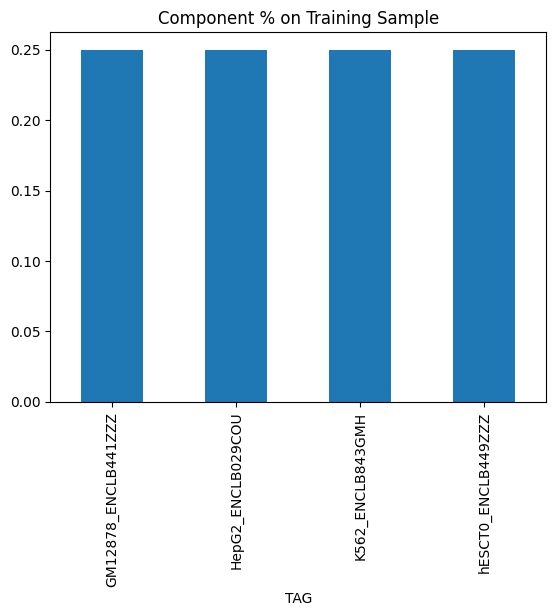

/tmp/ipykernel_1378614/2269798108.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_shuffled['sequence'] = df_train_shuffled['sequence'].apply(lambda x : ''.join(random.sample(list(x), len(x)))  )


Generating Fasta and Motis: train
------------------------------
39254 #seq used
Generating Motifs (all seqs)
Computing Motifs....
Scanning: 100%|██████████████████| 39254/39254 [01:03<00:00, 617.05 sequences/s]


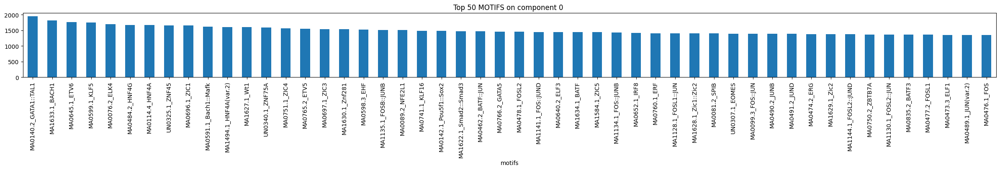

Generating Motifs per component
GM12878_ENCLB441ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 73.61 sequences/s]


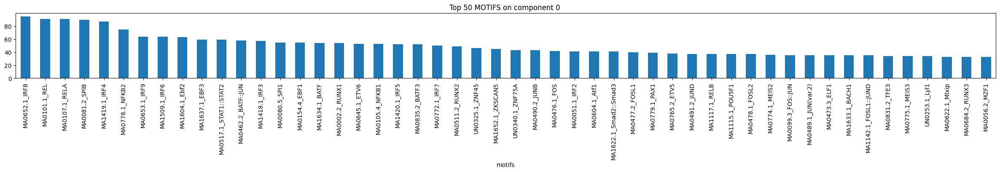

HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 74.37 sequences/s]


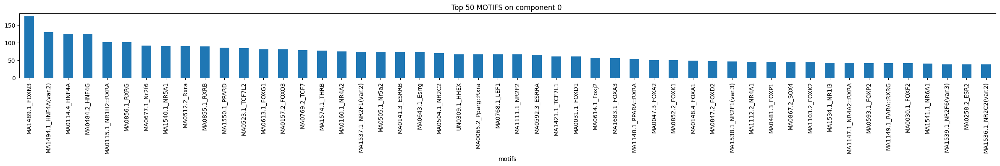

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 74.22 sequences/s]


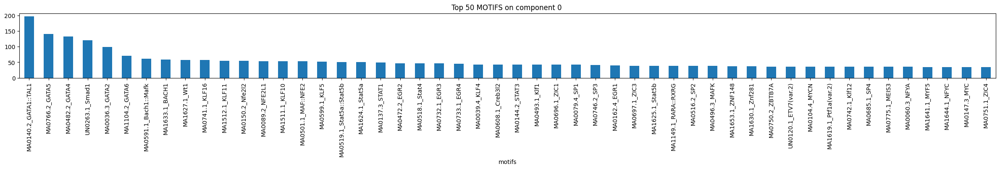

hESCT0_ENCLB449ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 74.08 sequences/s]


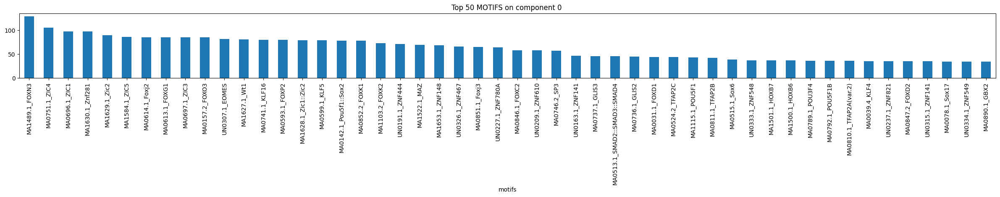

Generating Fasta and Motis: test
------------------------------
4565 #seq used
Generating Motifs (all seqs)
Computing Motifs....
Scanning: 100%|████████████████████| 4565/4565 [00:15<00:00, 296.68 sequences/s]


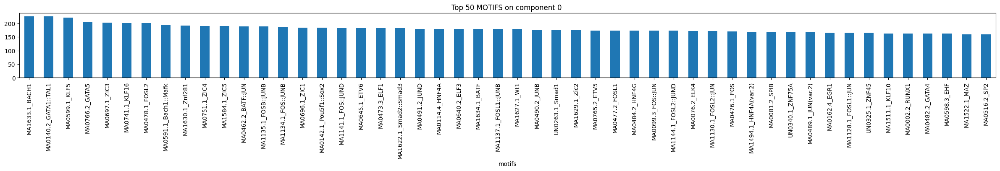

Generating Motifs per component
GM12878_ENCLB441ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 74.07 sequences/s]


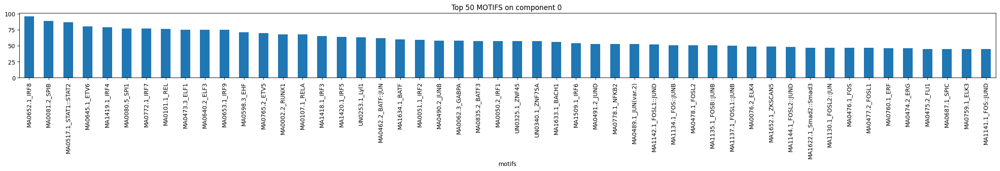

HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████| 958/958 [00:13<00:00, 72.16 sequences/s]


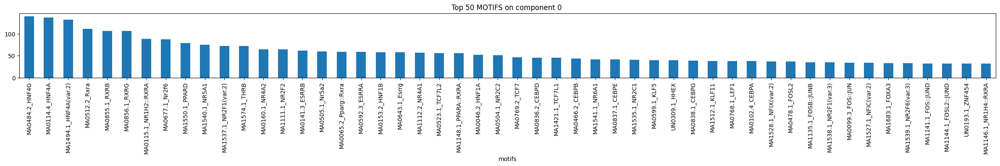

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 73.47 sequences/s]


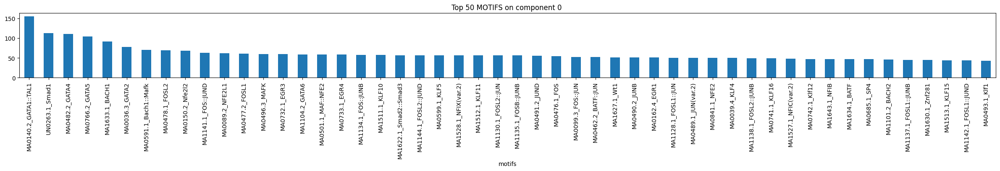

hESCT0_ENCLB449ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 74.27 sequences/s]


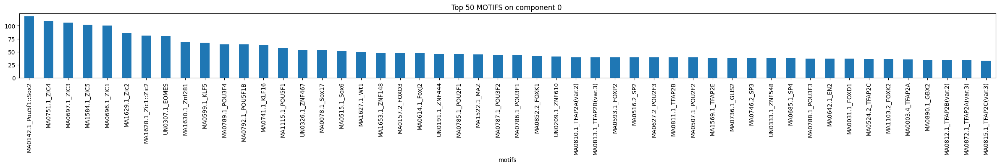

Generating Fasta and Motis: train_shuffle
------------------------------
4053 #seq used
Generating Motifs (all seqs)
Computing Motifs....
Scanning: 100%|████████████████████| 4053/4053 [00:15<00:00, 261.08 sequences/s]


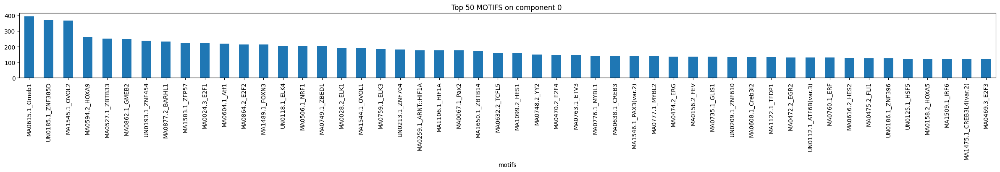

Generating Motifs per component
GM12878_ENCLB441ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 74.37 sequences/s]


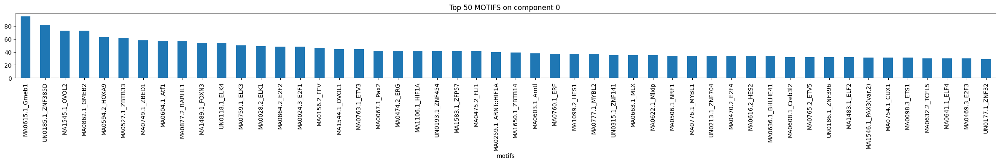

HepG2_ENCLB029COU
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|█████████████████████| 1000/1000 [00:13<00:00, 73.75 sequences/s]


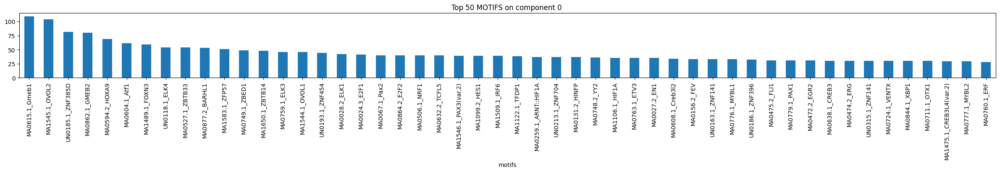

K562_ENCLB843GMH
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████| 878/878 [00:12<00:00, 69.09 sequences/s]


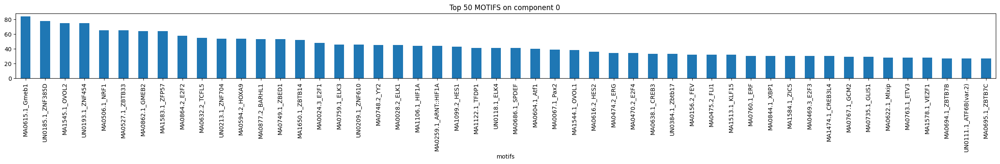

hESCT0_ENCLB449ZZZ
number of sequences used to generate the motifs
1000 #seq used
Computing Motifs....
Scanning: 100%|███████████████████████| 977/977 [00:13<00:00, 74.11 sequences/s]


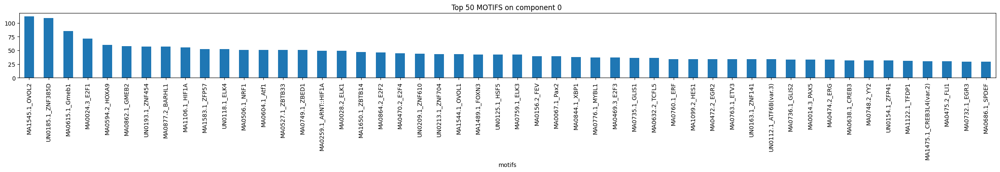

In [68]:
#code changes 1/20

import random

def motifs_from_fasta(fasta, generate_heatmap=True):
    print ('Computing Motifs....')
    !gimme scan $fasta -p  JASPAR2020_vertebrates -g hg38 > train_results_motifs.bed
    df_results_seq_guime = pd.read_csv('train_results_motifs.bed', sep='\t', skiprows=5, header=None)
    df_results_seq_guime['motifs'] = df_results_seq_guime[8].apply(lambda x: x.split( 'motif_name "'    )[1].split('"')[0]   )
    # if generate_heatmap:
    #     generate_heatmap_motifs(df_results_seq_guime)

    df_results_seq_guime[0] = df_results_seq_guime[0].apply(lambda x : '_'.join(  x.split('_')[:-1])    )
    df_results_seq_guime_count_out = df_results_seq_guime[[0,'motifs']].drop_duplicates().groupby('motifs').count()
    plt.rcParams["figure.figsize"] = (30,2)
    df_results_seq_guime_count_out.sort_values(0, ascending=False).head(50)[0].plot.bar()
    plt.title('Top 50 MOTIFS on component 0 ')
    plt.show()
    return df_results_seq_guime_count_out


class LoadingData():
    def __init__(self,input_csv,sample_number=0,subset_components=None, plot=True, change_component_index = True, limit_total_sequences=False, number_of_sequences_to_motif_creation=None ):
        '''subset_components: (NONE) list
                subset components should be a list of components to extract ex: [3,12,4,3]
           sample_number : 1000
               Total number o sequences
         '''
        
        self.csv = input_csv
        self.limit_total_sequences = limit_total_sequences
        self.plot = plot
        self.sample_number = sample_number
        self.subset_components = subset_components    # case none I need add all
        self.change_comp_index = change_component_index
        self.data =  self.read_csv()
        self.df_generate = self.experiment() 
        self.df_train_in, self.df_test_in , self.df_train_shuffled_in = self.create_train_groups()
        self.number_of_sequences_to_motif_creation = number_of_sequences_to_motif_creation
        self.train = None
        self.test = None
        self.train_shuffle = None
        self.get_motif()
        
    def read_csv(self):
        df =  pd.read_csv( self.csv , sep="\t")
        if self.change_comp_index:
            df['component']= df['component'] + 1
            
        if self.limit_total_sequences:
            print (f'Limiting total sequences {self.limit_total_sequences}')
            df = df.sample(self.limit_total_sequences)
            
        df.columns = [c.replace('seqname','chr') for c in df.columns.values]  # change this in simon original table
        return df
    def experiment(self):
        df_generate = self.data.copy()
        print (df_generate.head().columns)
        print ([c for c in self.subset_components])
        if self.subset_components != None and type(self.subset_components) == list:
            print (' or '.join([f'TAG == {c}' for c in self.subset_components]))
            df_generate = df_generate.query( ' or '.join([f'TAG == "{c}" ' for c in self.subset_components])).copy()
            print ('Subseting...')
        
        if self.plot:
            # I changed raw_sequence to sequence
            print (df_generate.head()) 
            (df_generate.groupby('TAG').count()['sequence']  / df_generate.groupby('TAG').count()['sequence'].sum() ).plot.bar()
            plt.title('Component % on Training Sample')
            plt.show()

        return df_generate
    
    
    def create_train_groups(self):
        
#         df_sampled = self.df_generate.sample(self.sample_number*2) #getting train and test
#         df_train = df_sampled.iloc[:self.sample_number].copy()
#         df_test = df_sampled.iloc[self.sample_number:].copy()

        #solve it inside the simon dataloader
    
        df_sampled = self.df_generate.query('chr != "chr1" ') 
        df_train = df_sampled.query('chr != "chr2" ') 
        df_test = self.df_generate.query('chr == "chr1" ') 
        df_train_shuffled = df_sampled.query('chr == "chr2" ') 
        
        df_train_shuffled['sequence'] = df_train_shuffled['sequence'].apply(lambda x : ''.join(random.sample(list(x), len(x)))  )
        return df_train , df_test , df_train_shuffled
        
        
    def get_motif(self):
        self.train = self.generate_motifs_and_fastas(self.df_train_in,  'train')
        self.test = self.generate_motifs_and_fastas(self.df_test_in, 'test')
        self.train_shuffle = self.generate_motifs_and_fastas(self.df_train_shuffled_in,'train_shuffle')
        
        
    def generate_motifs_and_fastas(self, df,name):
        '''return fasta anem , and dict with components motifs'''
        print ('Generating Fasta and Motis:', name)
        print ('---' * 10)
        fasta_saved = self.save_fasta(df, f"{name}_{'_'.join([str(c) for c in self.subset_components])}")
        print('Generating Motifs (all seqs)')
        motif_all_components = motifs_from_fasta(fasta_saved, False)
        print('Generating Motifs per component')
        train_comp_motifs_dict = self.generate_motifs_components(df)
        
        return {'fasta_name':fasta_saved ,
                'motifs': motif_all_components ,    
                'motifs_per_components_dict':train_comp_motifs_dict ,
                'dataset': df}
    
    
        
    def save_fasta(self, df , name_fasta, to_seq_groups_comparison=False):
        fasta_final_name = name_fasta + '.fasta'
        save_fasta_file= open(fasta_final_name, 'w')
        number_to_sample = df.shape[0] # case we dont want to limit the number of sequences used to calculate the motifs
        
        if to_seq_groups_comparison and self.number_of_sequences_to_motif_creation: # case we want, we select just the number defined in number_of_sequences_to_motif_creation
            number_to_sample = self.number_of_sequences_to_motif_creation
            
            
        print (number_to_sample, '#seq used')
        write_fasta_component = '\n'.join(df[['dhs_id', 'sequence', 'TAG']].head(number_to_sample).apply(lambda x : f'>{x[0]}_TAG_{x[2]}\n{x[1]}', axis=1).values.tolist())
        save_fasta_file.write(write_fasta_component)
        save_fasta_file.close()
        return fasta_final_name
    
    
    def generate_motifs_components(self, df ):
        final_comp_values = {}
        for comp,v_comp in df.groupby('TAG'):
            print (comp)
            print ('number of sequences used to generate the motifs')
            name_c_fasta = self.save_fasta(v_comp, 'temp_component' , to_seq_groups_comparison=True)
            final_comp_values[comp] = motifs_from_fasta(name_c_fasta, False)
        return final_comp_values


encode_data = LoadingData(DATA_PATH, change_component_index=False, subset_components=['GM12878_ENCLB441ZZZ',
                                                                                        'hESCT0_ENCLB449ZZZ',
                                                                                        'K562_ENCLB843GMH',
                                                                                         'HepG2_ENCLB029COU'], limit_total_sequences = LIMIT_TOTAL_SEQUENCES, number_of_sequences_to_motif_creation=NUMBER_OF_SAMPLING_TO_COMPARE_CELLS)





In [77]:
torch.cuda.is_initialized()

False

In [78]:
# pd.read_csv('K562_hESCT0_HepG2_GM12878_12k_sequences_per_group.txt', sep='\t' )

In [79]:
df_results_seq_guime_count_train = encode_data.train['motifs']
df_results_seq_guime_count_test = encode_data.test['motifs']
df_results_seq_guime_count_shuffle = encode_data.train_shuffle['motifs']


final_comp_values_train = encode_data.train['motifs_per_components_dict']
final_comp_values_test = encode_data.test['motifs_per_components_dict']
final_comp_values_shuffle = encode_data.train_shuffle[
    'motifs_per_components_dict'
]


df = encode_data.train['dataset']
cell_components = (
    df.sort_values('TAG')['TAG'].unique().tolist()
)  # I need to add this function inside the dataloader

In [80]:
# final_comp_values_trian

In [81]:
names_comp = '''7 Trophoblasts
5 CD8_cells
15 CD34_cells
9 Fetal_heart
12 Fetal_muscle
14 HMVEC(vascular)
3 hESC(Embryionic)
8 Fetal(Neural)
13 Intestine
2 Skin(stromalA)
4 Fibroblast(stromalB)
6 Renal(Cancer)
16 Esophageal(Cancer)
11 Fetal_Lung
10 Fetal_kidney
1 Tissue_Invariant'''.split(
    '\n'
)

labels_test = {int(x.split(' ')[0]): x.split(' ')[1] for x in names_comp}

In [82]:
def kl_comparison_between_dataset(first_dic, second_dict):
    final_comp_kl = []
    for k, v in first_dic.items():
        comp_array = []
        for k_second in second_dict.keys():
            kl_out = compare_motif_list(v, second_dict[k_second])
            comp_array.append(kl_out)
        final_comp_kl.append(comp_array)
    return final_comp_kl

In [83]:
def generate_heatmap_components(df_heat, x_label, y_label):
    plt.rcParams["figure.figsize"] = (10, 10)
    df_plot = pd.DataFrame(df_heat)
    print(cell_components)
    df_plot.columns = [x.split('_')[0] for x in cell_components]
    df_plot.index = df_plot.columns
    sns.heatmap(df_plot, cmap='Blues_r', annot=True, lw=0.1, vmax=1, vmin=0)
    plt.title(
        f'Kl divergence \n {x_label} sequences x  {y_label} sequences \n MOTIFS probabilities'
    )
    plt.xlabel(f'{x_label} Sequences  \n(motifs dist)')
    plt.ylabel(f'{y_label} \n (motifs dist)')

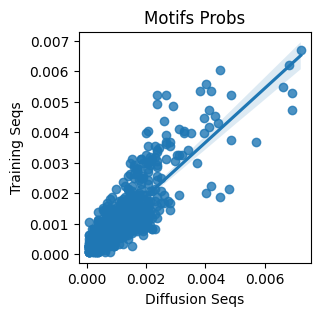

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,18,20,0.001367,0.001392
1,MA1599.1_ZNF682,20,14,0.001519,0.000975
2,MA1493.1_HES6,12,17,0.000912,0.001184
3,MA1550.1_PPARD,19,20,0.001443,0.001392
4,UN0164.1_ZNF174,13,13,0.000988,0.000905
...,...,...,...,...,...
880,MA0641.1_ELF4,27,40,0.002051,0.002785
881,MA0680.1_PAX7,1,5,0.000076,0.000348
882,MA0851.1_Foxj3,1,4,0.000076,0.000278
883,MA0791.1_POU4F3,3,4,0.000228,0.000278


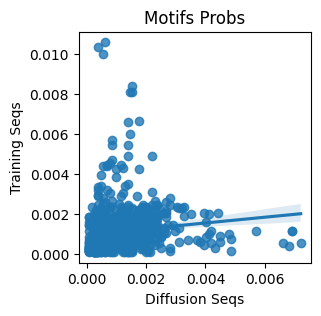

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,18,13,0.001367,0.000985
1,MA1599.1_ZNF682,20,24,0.001519,0.001819
2,MA1493.1_HES6,12,13,0.000912,0.000985
3,MA1550.1_PPARD,19,79,0.001443,0.005986
4,UN0164.1_ZNF174,13,13,0.000988,0.000985
...,...,...,...,...,...
881,MA0641.1_ELF4,27,20,0.002051,0.001515
882,MA0680.1_PAX7,1,5,0.000076,0.000379
883,MA0851.1_Foxj3,1,24,0.000076,0.001819
884,MA0791.1_POU4F3,3,6,0.000228,0.000455


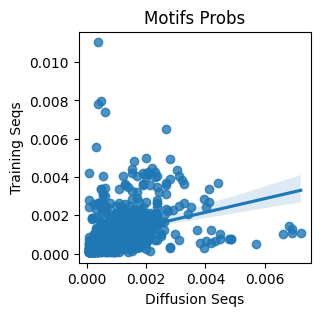

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,18,5,0.001367,0.000356
1,MA1599.1_ZNF682,20,24,0.001519,0.001710
2,MA1493.1_HES6,12,12,0.000912,0.000855
3,MA1550.1_PPARD,19,15,0.001443,0.001069
4,UN0164.1_ZNF174,13,15,0.000988,0.001069
...,...,...,...,...,...
880,MA0641.1_ELF4,27,29,0.002051,0.002066
881,MA0680.1_PAX7,1,3,0.000076,0.000214
882,MA0851.1_Foxj3,1,3,0.000076,0.000214
883,MA0791.1_POU4F3,3,2,0.000228,0.000142


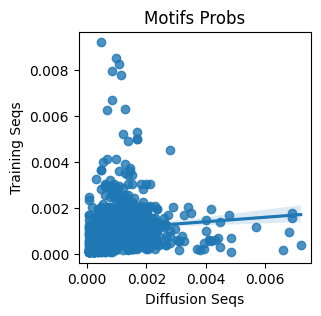

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,18,7,0.001367,0.000545
1,MA1599.1_ZNF682,20,16,0.001519,0.001247
2,MA1493.1_HES6,12,10,0.000911,0.000779
3,MA1550.1_PPARD,19,13,0.001443,0.001013
4,UN0164.1_ZNF174,13,17,0.000987,0.001325
...,...,...,...,...,...
886,MA0641.1_ELF4,27,18,0.002050,0.001403
887,MA0680.1_PAX7,1,2,0.000076,0.000156
888,MA0851.1_Foxj3,1,32,0.000076,0.002493
889,MA0791.1_POU4F3,3,4,0.000228,0.000312


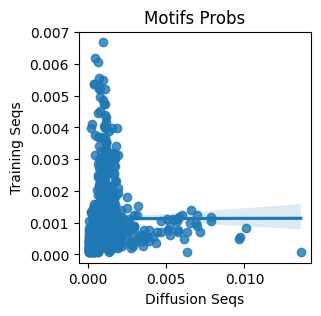

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,8,20,0.000622,0.001392
1,MA1599.1_ZNF682,26,14,0.002021,0.000975
2,MA1493.1_HES6,9,17,0.000700,0.001184
3,MA1550.1_PPARD,85,20,0.006607,0.001392
4,UN0164.1_ZNF174,10,13,0.000777,0.000905
...,...,...,...,...,...
881,MA0641.1_ELF4,10,40,0.000777,0.002785
882,MA0680.1_PAX7,3,5,0.000233,0.000348
883,MA0851.1_Foxj3,28,4,0.002176,0.000278
884,MA0791.1_POU4F3,9,4,0.000700,0.000278


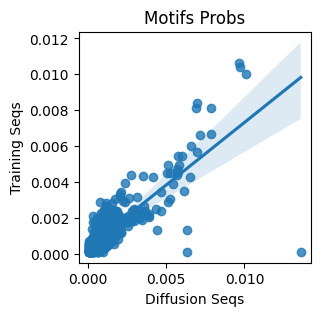

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,8,13,0.000622,0.000985
1,MA1599.1_ZNF682,26,24,0.002021,0.001818
2,MA1493.1_HES6,9,13,0.000699,0.000985
3,MA1550.1_PPARD,85,79,0.006606,0.005986
4,UN0164.1_ZNF174,10,13,0.000777,0.000985
...,...,...,...,...,...
882,MA0641.1_ELF4,10,20,0.000777,0.001515
883,MA0680.1_PAX7,3,5,0.000233,0.000379
884,MA0851.1_Foxj3,28,24,0.002176,0.001818
885,MA0791.1_POU4F3,9,6,0.000699,0.000455


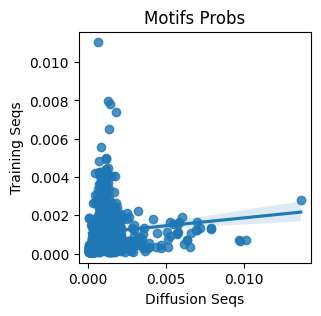

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,8,5,0.000622,0.000356
1,MA1599.1_ZNF682,26,24,0.002022,0.001710
2,MA1493.1_HES6,9,12,0.000700,0.000855
3,MA1550.1_PPARD,85,15,0.006609,0.001069
4,UN0164.1_ZNF174,10,15,0.000778,0.001069
...,...,...,...,...,...
876,MA0641.1_ELF4,10,29,0.000778,0.002066
877,MA0680.1_PAX7,3,3,0.000233,0.000214
878,MA0851.1_Foxj3,28,3,0.002177,0.000214
879,MA0791.1_POU4F3,9,2,0.000700,0.000143


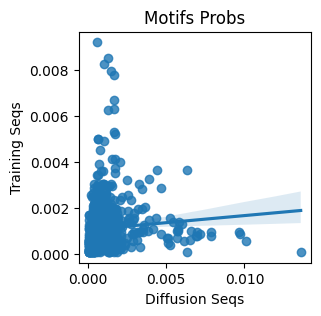

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,8,7,0.000622,0.000545
1,MA1599.1_ZNF682,26,16,0.002020,0.001247
2,MA1493.1_HES6,9,10,0.000699,0.000779
3,MA1550.1_PPARD,85,13,0.006604,0.001013
4,UN0164.1_ZNF174,10,17,0.000777,0.001325
...,...,...,...,...,...
886,MA0641.1_ELF4,10,18,0.000777,0.001403
887,MA0680.1_PAX7,3,2,0.000233,0.000156
888,MA0851.1_Foxj3,28,32,0.002175,0.002493
889,MA0791.1_POU4F3,9,4,0.000699,0.000312


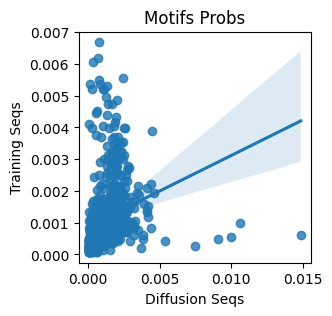

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,20,0.000528,0.001393
1,MA1599.1_ZNF682,33,14,0.002489,0.000975
2,MA1493.1_HES6,10,17,0.000754,0.001184
3,MA1550.1_PPARD,25,20,0.001886,0.001393
4,UN0164.1_ZNF174,16,13,0.001207,0.000905
...,...,...,...,...,...
877,MA0641.1_ELF4,27,40,0.002037,0.002786
878,MA0680.1_PAX7,2,5,0.000151,0.000348
879,MA0851.1_Foxj3,6,4,0.000453,0.000279
880,MA0791.1_POU4F3,1,4,0.000075,0.000279


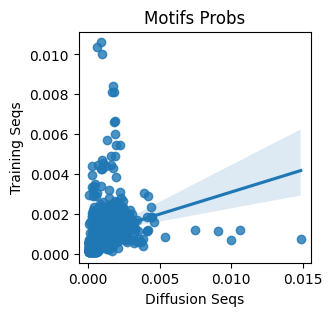

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,13,0.000528,0.000985
1,MA1599.1_ZNF682,33,24,0.002489,0.001819
2,MA1493.1_HES6,10,13,0.000754,0.000985
3,MA1550.1_PPARD,25,79,0.001886,0.005988
4,UN0164.1_ZNF174,16,13,0.001207,0.000985
...,...,...,...,...,...
878,MA0641.1_ELF4,27,20,0.002036,0.001516
879,MA0680.1_PAX7,2,5,0.000151,0.000379
880,MA0851.1_Foxj3,6,24,0.000453,0.001819
881,MA0791.1_POU4F3,1,6,0.000075,0.000455


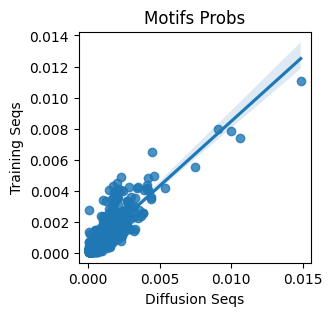

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,5,0.000528,0.000356
1,MA1599.1_ZNF682,33,24,0.002489,0.001710
2,MA1493.1_HES6,10,12,0.000754,0.000855
3,MA1550.1_PPARD,25,15,0.001886,0.001069
4,UN0164.1_ZNF174,16,15,0.001207,0.001069
...,...,...,...,...,...
877,MA0641.1_ELF4,27,29,0.002037,0.002066
878,MA0680.1_PAX7,2,3,0.000151,0.000214
879,MA0851.1_Foxj3,6,3,0.000453,0.000214
880,MA0791.1_POU4F3,1,2,0.000075,0.000143


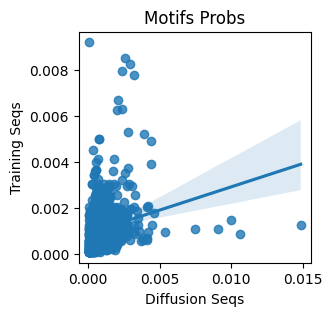

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,7,0.000528,0.000546
1,MA1599.1_ZNF682,33,16,0.002488,0.001247
2,MA1493.1_HES6,10,10,0.000754,0.000779
3,MA1550.1_PPARD,25,13,0.001885,0.001013
4,UN0164.1_ZNF174,16,17,0.001206,0.001325
...,...,...,...,...,...
883,MA0641.1_ELF4,27,18,0.002036,0.001403
884,MA0680.1_PAX7,2,2,0.000151,0.000156
885,MA0851.1_Foxj3,6,32,0.000452,0.002494
886,MA0791.1_POU4F3,1,4,0.000075,0.000312


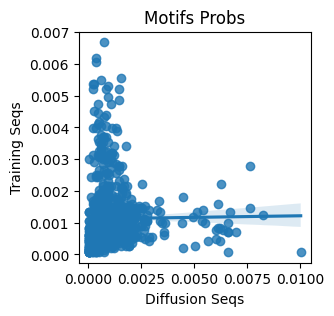

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,20,0.000544,0.001392
1,MA1599.1_ZNF682,13,14,0.001011,0.000975
2,MA1493.1_HES6,7,17,0.000544,0.001184
3,MA1550.1_PPARD,18,20,0.001399,0.001392
4,UN0164.1_ZNF174,6,13,0.000466,0.000905
...,...,...,...,...,...
881,MA0641.1_ELF4,21,40,0.001632,0.002785
882,MA0680.1_PAX7,3,5,0.000233,0.000348
883,MA0851.1_Foxj3,65,4,0.005053,0.000278
884,MA0791.1_POU4F3,3,4,0.000233,0.000278


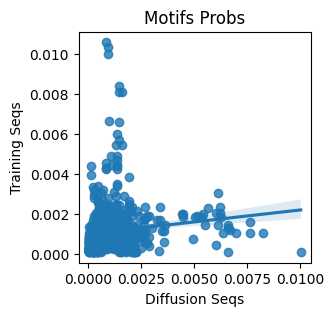

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,13,0.000544,0.000985
1,MA1599.1_ZNF682,13,24,0.001010,0.001818
2,MA1493.1_HES6,7,13,0.000544,0.000985
3,MA1550.1_PPARD,18,79,0.001399,0.005986
4,UN0164.1_ZNF174,6,13,0.000466,0.000985
...,...,...,...,...,...
882,MA0641.1_ELF4,21,20,0.001632,0.001515
883,MA0680.1_PAX7,3,5,0.000233,0.000379
884,MA0851.1_Foxj3,65,24,0.005052,0.001818
885,MA0791.1_POU4F3,3,6,0.000233,0.000455


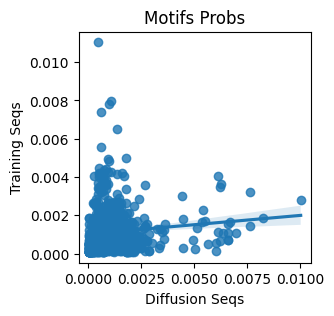

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,5,0.000544,0.000356
1,MA1599.1_ZNF682,13,24,0.001011,0.001710
2,MA1493.1_HES6,7,12,0.000544,0.000855
3,MA1550.1_PPARD,18,15,0.001399,0.001069
4,UN0164.1_ZNF174,6,15,0.000466,0.001069
...,...,...,...,...,...
879,MA0641.1_ELF4,21,29,0.001633,0.002066
880,MA0680.1_PAX7,3,3,0.000233,0.000214
881,MA0851.1_Foxj3,65,3,0.005054,0.000214
882,MA0791.1_POU4F3,3,2,0.000233,0.000142


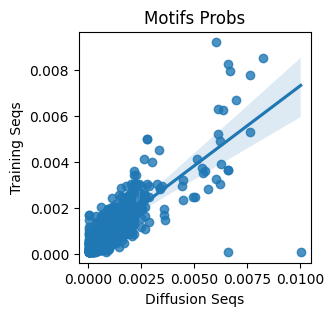

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,7,0.000544,0.000545
1,MA1599.1_ZNF682,13,16,0.001010,0.001247
2,MA1493.1_HES6,7,10,0.000544,0.000779
3,MA1550.1_PPARD,18,13,0.001399,0.001013
4,UN0164.1_ZNF174,6,17,0.000466,0.001325
...,...,...,...,...,...
886,MA0641.1_ELF4,21,18,0.001632,0.001403
887,MA0680.1_PAX7,3,2,0.000233,0.000156
888,MA0851.1_Foxj3,65,32,0.005051,0.002493
889,MA0791.1_POU4F3,3,4,0.000233,0.000312


In [84]:
heat_train_test = kl_comparison_between_dataset(
    final_comp_values_train, final_comp_values_test
)

In [85]:
torch.cuda.is_initialized()

False

['GM12878_ENCLB441ZZZ', 'HepG2_ENCLB029COU', 'K562_ENCLB843GMH', 'hESCT0_ENCLB449ZZZ']


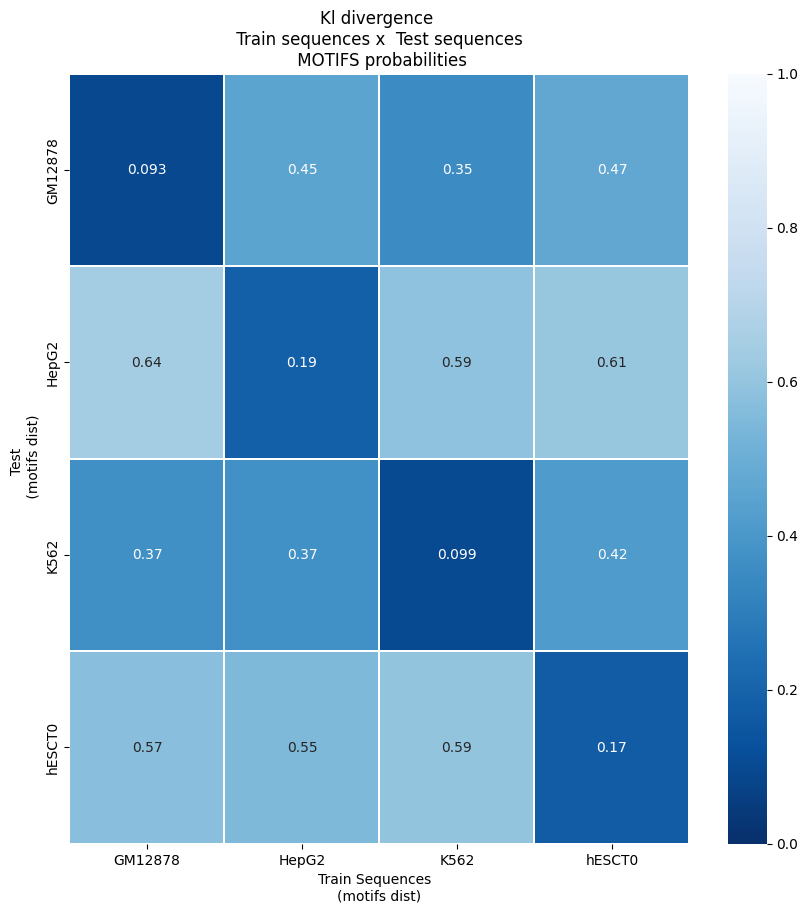

In [86]:
generate_heatmap_components(heat_train_test, 'Train', 'Test')

In [87]:
torch.cuda.is_initialized()

False

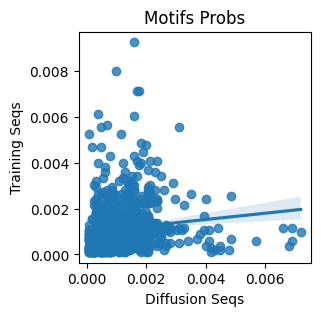

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,18,12,0.001367,0.001167
1,MA1599.1_ZNF682,20,10,0.001519,0.000972
2,MA1493.1_HES6,12,21,0.000911,0.002042
3,MA1550.1_PPARD,19,7,0.001443,0.000681
4,UN0164.1_ZNF174,13,21,0.000987,0.002042
...,...,...,...,...,...
884,MA0641.1_ELF4,27,30,0.002051,0.002917
885,MA0680.1_PAX7,1,9,0.000076,0.000875
886,MA0851.1_Foxj3,1,3,0.000076,0.000292
887,MA0791.1_POU4F3,3,11,0.000228,0.001070


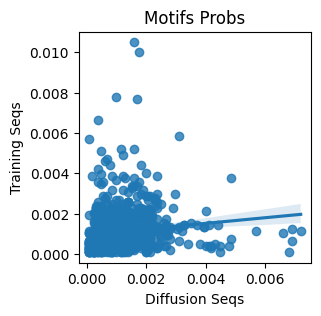

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,18,11,0.001367,0.001059
1,MA1599.1_ZNF682,20,6,0.001519,0.000578
2,MA1493.1_HES6,12,15,0.000911,0.001444
3,MA1550.1_PPARD,19,8,0.001443,0.000770
4,UN0164.1_ZNF174,13,16,0.000987,0.001540
...,...,...,...,...,...
884,MA0641.1_ELF4,27,22,0.002051,0.002118
885,MA0680.1_PAX7,1,6,0.000076,0.000578
886,MA0851.1_Foxj3,1,6,0.000076,0.000578
887,MA0791.1_POU4F3,3,8,0.000228,0.000770


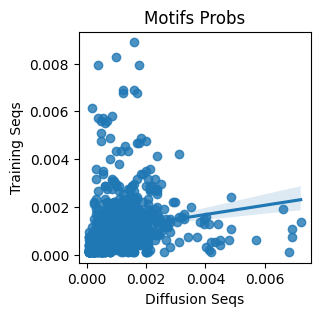

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,18,9,0.001367,0.000953
1,MA1599.1_ZNF682,20,12,0.001519,0.001270
2,MA1493.1_HES6,12,21,0.000912,0.002223
3,MA1550.1_PPARD,19,9,0.001443,0.000953
4,UN0164.1_ZNF174,13,20,0.000988,0.002117
...,...,...,...,...,...
881,MA0641.1_ELF4,27,17,0.002051,0.001799
882,MA0680.1_PAX7,1,2,0.000076,0.000212
883,MA0851.1_Foxj3,1,4,0.000076,0.000423
884,MA0791.1_POU4F3,3,2,0.000228,0.000212


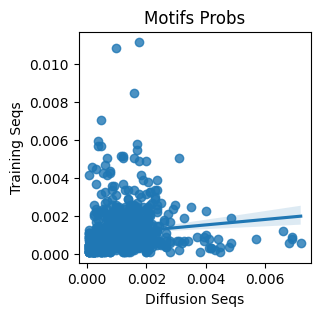

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,18,14,0.001367,0.001390
1,MA1599.1_ZNF682,20,4,0.001518,0.000397
2,MA1493.1_HES6,12,17,0.000911,0.001688
3,MA1550.1_PPARD,19,7,0.001443,0.000695
4,UN0164.1_ZNF174,13,25,0.000987,0.002482
...,...,...,...,...,...
888,MA0641.1_ELF4,27,22,0.002050,0.002184
889,MA0680.1_PAX7,1,5,0.000076,0.000496
890,MA0851.1_Foxj3,1,5,0.000076,0.000496
891,MA0791.1_POU4F3,3,7,0.000228,0.000695


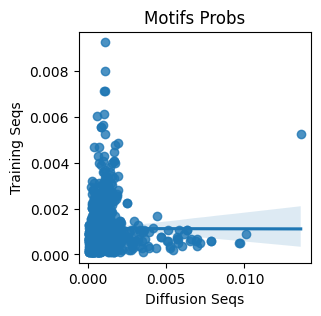

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,8,12,0.000622,0.001167
1,MA1599.1_ZNF682,26,10,0.002021,0.000973
2,MA1493.1_HES6,9,21,0.000700,0.002043
3,MA1550.1_PPARD,85,7,0.006607,0.000681
4,UN0164.1_ZNF174,10,21,0.000777,0.002043
...,...,...,...,...,...
881,MA0641.1_ELF4,10,30,0.000777,0.002918
882,MA0680.1_PAX7,3,9,0.000233,0.000875
883,MA0851.1_Foxj3,28,3,0.002176,0.000292
884,MA0791.1_POU4F3,9,11,0.000700,0.001070


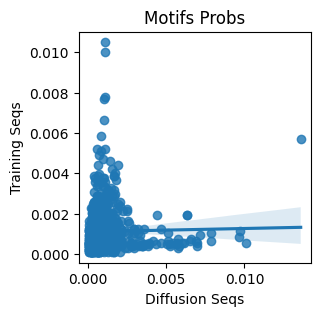

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,8,11,0.000622,0.001059
1,MA1599.1_ZNF682,26,6,0.002021,0.000578
2,MA1493.1_HES6,9,15,0.000700,0.001444
3,MA1550.1_PPARD,85,8,0.006607,0.000770
4,UN0164.1_ZNF174,10,16,0.000777,0.001541
...,...,...,...,...,...
881,MA0641.1_ELF4,10,22,0.000777,0.002118
882,MA0680.1_PAX7,3,6,0.000233,0.000578
883,MA0851.1_Foxj3,28,6,0.002176,0.000578
884,MA0791.1_POU4F3,9,8,0.000700,0.000770


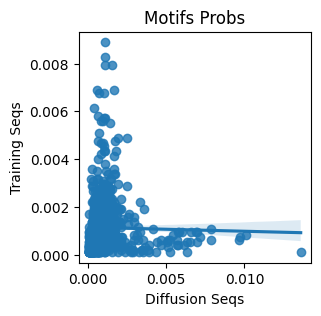

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,8,9,0.000622,0.000953
1,MA1599.1_ZNF682,26,12,0.002021,0.001270
2,MA1493.1_HES6,9,21,0.000700,0.002223
3,MA1550.1_PPARD,85,9,0.006608,0.000953
4,UN0164.1_ZNF174,10,20,0.000777,0.002117
...,...,...,...,...,...
879,MA0641.1_ELF4,10,17,0.000777,0.001800
880,MA0680.1_PAX7,3,2,0.000233,0.000212
881,MA0851.1_Foxj3,28,4,0.002177,0.000423
882,MA0791.1_POU4F3,9,2,0.000700,0.000212


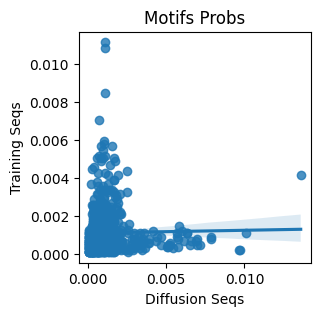

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,8,14,0.000622,0.001390
1,MA1599.1_ZNF682,26,4,0.002020,0.000397
2,MA1493.1_HES6,9,17,0.000699,0.001688
3,MA1550.1_PPARD,85,7,0.006604,0.000695
4,UN0164.1_ZNF174,10,25,0.000777,0.002483
...,...,...,...,...,...
886,MA0641.1_ELF4,10,22,0.000777,0.002185
887,MA0680.1_PAX7,3,5,0.000233,0.000497
888,MA0851.1_Foxj3,28,5,0.002175,0.000497
889,MA0791.1_POU4F3,9,7,0.000699,0.000695


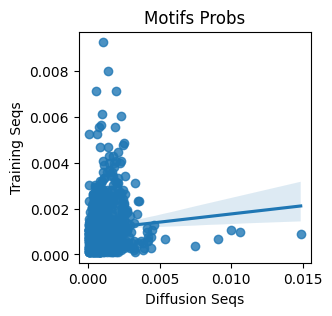

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,12,0.000528,0.001168
1,MA1599.1_ZNF682,33,10,0.002489,0.000973
2,MA1493.1_HES6,10,21,0.000754,0.002043
3,MA1550.1_PPARD,25,7,0.001886,0.000681
4,UN0164.1_ZNF174,16,21,0.001207,0.002043
...,...,...,...,...,...
878,MA0641.1_ELF4,27,30,0.002036,0.002919
879,MA0680.1_PAX7,2,9,0.000151,0.000876
880,MA0851.1_Foxj3,6,3,0.000453,0.000292
881,MA0791.1_POU4F3,1,11,0.000075,0.001070


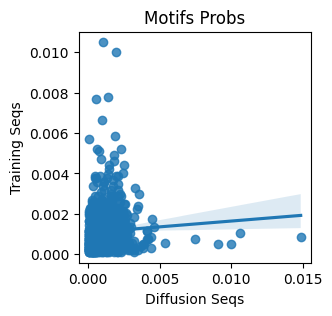

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,11,0.000528,0.001059
1,MA1599.1_ZNF682,33,6,0.002489,0.000578
2,MA1493.1_HES6,10,15,0.000754,0.001444
3,MA1550.1_PPARD,25,8,0.001885,0.000770
4,UN0164.1_ZNF174,16,16,0.001207,0.001541
...,...,...,...,...,...
880,MA0641.1_ELF4,27,22,0.002036,0.002118
881,MA0680.1_PAX7,2,6,0.000151,0.000578
882,MA0851.1_Foxj3,6,6,0.000452,0.000578
883,MA0791.1_POU4F3,1,8,0.000075,0.000770


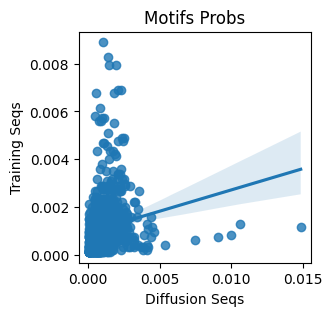

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,9,0.000528,0.000953
1,MA1599.1_ZNF682,33,12,0.002489,0.001271
2,MA1493.1_HES6,10,21,0.000754,0.002224
3,MA1550.1_PPARD,25,9,0.001886,0.000953
4,UN0164.1_ZNF174,16,20,0.001207,0.002118
...,...,...,...,...,...
875,MA0641.1_ELF4,27,17,0.002037,0.001800
876,MA0680.1_PAX7,2,2,0.000151,0.000212
877,MA0851.1_Foxj3,6,4,0.000453,0.000424
878,MA0791.1_POU4F3,1,2,0.000075,0.000212


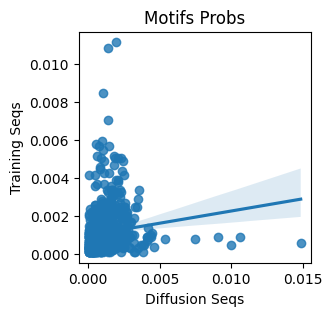

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,14,0.000528,0.001391
1,MA1599.1_ZNF682,33,4,0.002488,0.000397
2,MA1493.1_HES6,10,17,0.000754,0.001689
3,MA1550.1_PPARD,25,7,0.001885,0.000695
4,UN0164.1_ZNF174,16,25,0.001206,0.002484
...,...,...,...,...,...
882,MA0641.1_ELF4,27,22,0.002036,0.002186
883,MA0680.1_PAX7,2,5,0.000151,0.000497
884,MA0851.1_Foxj3,6,5,0.000452,0.000497
885,MA0791.1_POU4F3,1,7,0.000075,0.000695


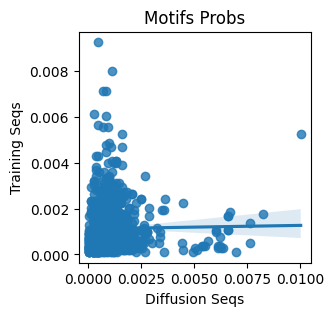

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,12,0.000544,0.001167
1,MA1599.1_ZNF682,13,10,0.001011,0.000973
2,MA1493.1_HES6,7,21,0.000544,0.002043
3,MA1550.1_PPARD,18,7,0.001399,0.000681
4,UN0164.1_ZNF174,6,21,0.000466,0.002043
...,...,...,...,...,...
879,MA0641.1_ELF4,21,30,0.001633,0.002919
880,MA0680.1_PAX7,3,9,0.000233,0.000876
881,MA0851.1_Foxj3,65,3,0.005054,0.000292
882,MA0791.1_POU4F3,3,11,0.000233,0.001070


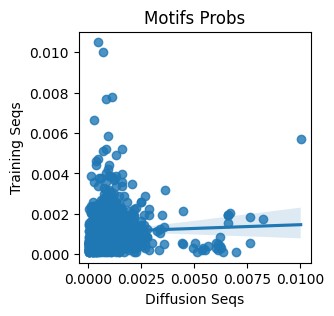

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,11,0.000544,0.001059
1,MA1599.1_ZNF682,13,6,0.001011,0.000578
2,MA1493.1_HES6,7,15,0.000544,0.001444
3,MA1550.1_PPARD,18,8,0.001399,0.000770
4,UN0164.1_ZNF174,6,16,0.000466,0.001541
...,...,...,...,...,...
880,MA0641.1_ELF4,21,22,0.001633,0.002118
881,MA0680.1_PAX7,3,6,0.000233,0.000578
882,MA0851.1_Foxj3,65,6,0.005053,0.000578
883,MA0791.1_POU4F3,3,8,0.000233,0.000770


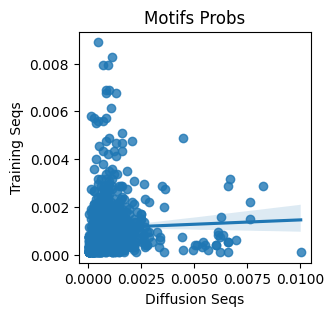

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,9,0.000544,0.000953
1,MA1599.1_ZNF682,13,12,0.001011,0.001271
2,MA1493.1_HES6,7,21,0.000544,0.002224
3,MA1550.1_PPARD,18,9,0.001400,0.000953
4,UN0164.1_ZNF174,6,20,0.000467,0.002118
...,...,...,...,...,...
877,MA0641.1_ELF4,21,17,0.001633,0.001800
878,MA0680.1_PAX7,3,2,0.000233,0.000212
879,MA0851.1_Foxj3,65,4,0.005054,0.000424
880,MA0791.1_POU4F3,3,2,0.000233,0.000212


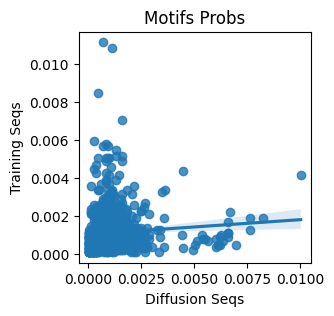

,motif,motif_a,motif_b,Diffusion_seqs,Training_seqs
0,MA1496.1_HOXA4,7,14,0.000544,0.001391
1,MA1599.1_ZNF682,13,4,0.001010,0.000397
2,MA1493.1_HES6,7,17,0.000544,0.001689
3,MA1550.1_PPARD,18,7,0.001399,0.000695
4,UN0164.1_ZNF174,6,25,0.000466,0.002484
...,...,...,...,...,...
882,MA0641.1_ELF4,21,22,0.001632,0.002186
883,MA0680.1_PAX7,3,5,0.000233,0.000497
884,MA0851.1_Foxj3,65,5,0.005052,0.000497
885,MA0791.1_POU4F3,3,7,0.000233,0.000695


In [88]:
heat_train_shuffle = kl_comparison_between_dataset(
    final_comp_values_train, final_comp_values_shuffle
)

In [89]:
torch.cuda.is_initialized()

False

['GM12878_ENCLB441ZZZ', 'HepG2_ENCLB029COU', 'K562_ENCLB843GMH', 'hESCT0_ENCLB449ZZZ']


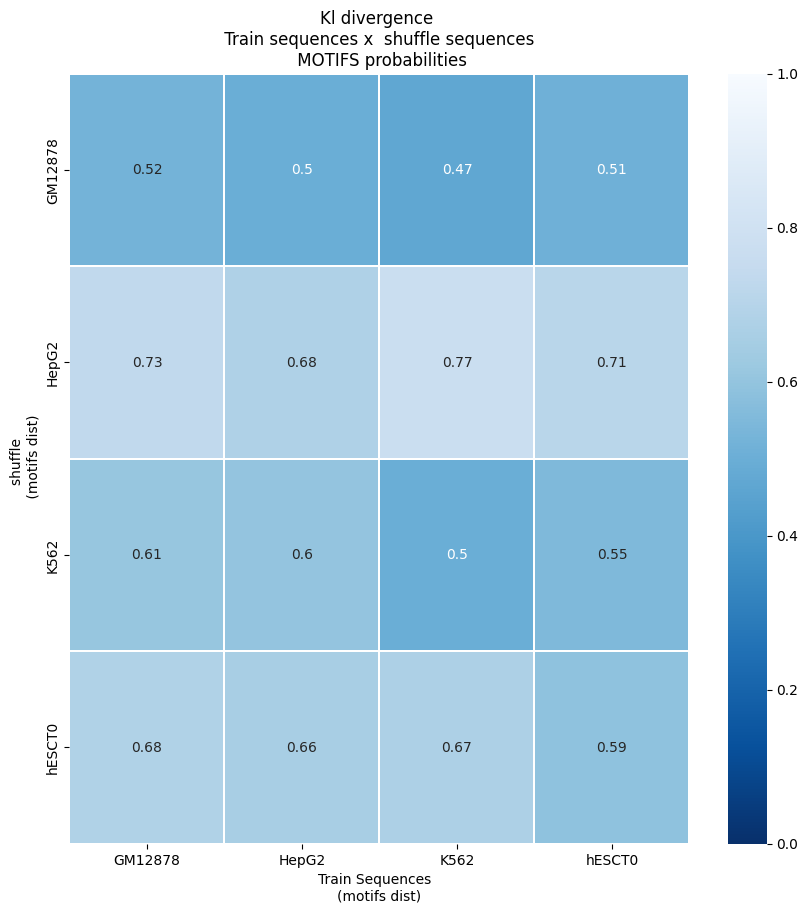

In [91]:
generate_heatmap_components(heat_train_shuffle, 'Train', 'shuffle')

## OVERFIT

In [49]:
# #Case want to test overfiiting (1500epochs)
# X_OVERFIT = np.array(X_train[0].tolist() * 200).reshape(-1,4,200)
# X_train = X_OVERFIT

# Train initialize and Training loop

In [103]:
# if LATENT:
#     with open('train_data_quantized.pkl', 'rb') as f:
#         train_data_quantized=pickle.load(f)


def train_latent_or_real(df, latent=False, train_data_quantized=None):
    if latent:
        train_data_quantized = train_data_quantized.flatten(start_dim=2)
        X_train = train_data_quantized.cpu().detach().numpy()
    else:
        X_train = np.array(
            [
                one_hot_encode(x, nucleotides, 200)
                for x in tqdm_notebook(df['sequence'])
                if 'N' not in x
            ]
        )
        X_train = np.array([x.T.tolist() for x in X_train])
        X_train[X_train == 0] = -1

    # conditional training init
    conditional_tag_to_numeric = {
        x: n + 1 for n, x in enumerate(df['TAG'].unique())
    }  # check if this is changing order during different executions
    conditional_numeric_to_tag = {
        n + 1: x for n, x in enumerate(df['TAG'].unique())
    }  # check if this is changing order

    cell_types = sorted(list(conditional_numeric_to_tag.keys()))

    # cell_types = sorted(list(df['TAG'].unique()))
    x_train_cell_type = torch.from_numpy(
        df["TAG"].apply(lambda x: conditional_tag_to_numeric[x]).to_numpy()
    )
    # x_train_cell_type = torch.from_numpy(df["TAG"].to_numpy())

    return X_train, cell_types, x_train_cell_type


X_train, cell_types, x_train_cell_type = train_latent_or_real(
    df, latent=LATENT, train_data_quantized=train_data_quantized
)

In [104]:
def extract(a, t, x_shape, device=None):
    batch_size = t.shape[0]
    if device:
        # print('add device')
        a = a.to(device)
        t = t.to(device)

    # print(a.device, 'a', t.device, 't')

    out = a.gather(-1, t)
    # out = a.gather(-1) # to accelerate
    result = out.reshape(batch_size, *((1,) * (len(x_shape) - 1)))
    if device:
        result.to(device)
    return result

In [105]:
from pathlib import Path


def save_model(
    milestone, step, accelerator, opt, model, ema_model, folder_path_string=''
):
    results_folder = Path(folder_path_string)

    data = {
        'step': step,
        'model': accelerator.get_state_dict(model),
        #'opt': opt.state_dict(),
        #'ema': ema_model.state_dict(),
        #'ema':accelerator.get_state_dict(ema_model)
    }

    torch.save(data, str(results_folder / f'model_{milestone}.pt'))


def recreating_models(latent=False):
    if latent:
        model = Unet_lucas(
            dim=50,
            channels=1,
            dim_mults=(1, 2),
            resnet_block_groups=2,
            num_classes=TOTAL_class_number,
            latent=True,
        )
    else:
        model = Unet_lucas(
            dim=200,
            channels=1,
            dim_mults=(1, 2, 4),
            resnet_block_groups=4,
            num_classes=TOTAL_class_number,
        )

    # ema = EMA(0.995)
    # ema_model = copy.deepcopy(model).eval().requires_grad_(False)
    # optimizer = Adam(model.parameters(), lr=1e-4)  #it was 1e-4  ()

    return model


def load_model(model_name, folder_path_string='', latent=False):
    results_folder = Path(folder_path_string)
    data = torch.load(str(results_folder / model_name))

    # model = accelerator.unwrap_model(model)
    model = recreating_models(latent)
    model.load_state_dict(data['model'])

    step = data['step']
    # opt.load_state_dict(data['opt'])
    # ema_model.load_state_dict(data['ema'])

    return model, step

In [106]:
# load_model('model_model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.pt')

## Metrics: Train and Test should go down (train lower than test) and shuffle should go up

<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [108]:
%env NCCL_DEBUG=info
#%env NCCL_IB_DISABLE=1
%env CUDA_LAUNCH_BLOCKING=1




from livelossplot import PlotLosses
from accelerate.utils import set_seed
from accelerate import DistributedDataParallelKwargs

def train_accelerate():
    epochs = EPOCHS
    save_and_sample_every =SAVE_AND_SAMPLE_EVERY_N_EPOCH
    epochs_loss_show = EPOCH_LOSS_SHOW_INTERVAL
    image_size = IMAGE_SIZE
    channels = 1
    batch_size = BATCH_SIZE
    timesteps = TIME_STEPS

    print (MODEL_NAME)
    set_seed(12345)
    ddp_kwargs = DistributedDataParallelKwargs(find_unused_parameters=True)
    accelerator = Accelerator(kwargs_handlers=[ddp_kwargs], split_batches =True)

    device = accelerator.device
    device
    
    tf = T.Compose([T.ToTensor()])

    seq_dataset = SequenceDataset(seqs=X_train, c=x_train_cell_type, transform=tf)
    train_dl = DataLoader(seq_dataset, batch_size, shuffle=True, num_workers=1  )  #  , pin_memory=True)  to accelerate


    # define beta schedule
    betas = linear_beta_schedule(timesteps=timesteps, beta_end=0.2)
    betas.to(device)
    print (torch.cuda.is_initialized())
    #betas = cosine_beta_schedule(timesteps=timesteps,  s=0.0001 )
    # define alphas 
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    print (torch.cuda.is_initialized())
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    print (torch.cuda.is_initialized())
    # calculations for diffusion q(x_t | x_{t-1}) and others
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    print (torch.cuda.is_initialized() )      
    #sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    print (torch.cuda.is_initialized())
    # calculations for posterior q(x_{t-1} | x_t, x_0)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)
    print (torch.cuda.is_initialized())
    

    print (device)
    if LATENT:
        image_size=LATENT_SIZE
        model = Unet_lucas(
        dim = 50,
            channels = 1,
        dim_mults = (1,2),
        resnet_block_groups = 2,
        num_classes=TOTAL_class_number,
        latent=True
        )
    else:
        model_vq = None
        model = Unet_lucas(
            dim = 200,
                channels = 1,
            dim_mults = (1,2,4),
            resnet_block_groups = 4,
            num_classes=TOTAL_class_number
        )   # .c u d a()   To accelerate

    print ('model created')
    #model.to(device) # To accelerate

    optimizer = Adam(model.parameters(), lr=1e-4)  #it was 1e-4  ()

    print ('opt created')

    
    train_kl ,test_kl , shuffle_kl =1,1,1
    
    #live_kl = PlotLosses(groups={ 'KL':['train', 'test', 'shuffle'], 'DiffusionLoss':['loss'] }, outputs=[TensorboardLogger(logdir='tensorboard_logs/')])
    live_kl = PlotLosses(groups={ 'KL':['train', 'test', 'shuffle'], 'DiffusionLoss':['loss'] })

    print ('live_kl')

    #,'Diffusion_Loss':['loss']
    # live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': 100})
    train_kl, test_kl , shuffle_kl = 1,1,1
    
    
    model, optimizer, train_dl = accelerator.prepare(model, optimizer, train_dl)   # To accelerate
    print ('preapare')


    
    if accelerator.is_main_process:
        ema = EMA(0.995)
        ema_model = copy.deepcopy(model).eval().requires_grad_(False)
        print ('ema created')

    model.output_attention = False

    for epoch in tqdm(range(epochs)):
        model.train()
        for step, batch in enumerate(train_dl):
            # print (step)
            
            #accelerator.print(f"epoch {epoch} {step}")

            x, y = batch
            x = x.type(torch.float32)#.to(device)
            y = y.type(torch.long)#.to(device)

            #print (batch[0].dtype)
            batch_size = x.shape[0]
            #print (batch_size, 'batch_size')
            # batch_size = batch["pixel_values"].shape[0]
            # batch = batch["pixel_values"].to(device)
            # Algorithm 1 line 3: sample t uniformally for every example in the batch
            #t = torch.randint(0, timesteps, (batch_size,), device=device).long() # sampling a t to generate t and t+1 # to accelerate
            t = torch.randint(0, timesteps, (batch_size,)).long() # sampling a t to generate t and t+1

            #print (t.dtype)
            #loss = p_losses(model, batch, t, loss_type="l2")
            #print (y)
            
            with accelerator.autocast():
                loss = p_losses(model, x, t, y, loss_type="huber" , sqrt_alphas_cumprod_in= sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod_in = sqrt_one_minus_alphas_cumprod, device=device)
                #loss.backward()
            

            
            optimizer.zero_grad()
            accelerator.backward(loss)
            accelerator.wait_for_everyone()
            optimizer.step()
            
            accelerator.wait_for_everyone()
            if accelerator.is_main_process: 
                ema.step_ema(ema_model, model)


        if (epoch % epochs_loss_show) == 0:
            if accelerator.is_main_process: 
                live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': loss.item()})
                live_kl.send()
                print(f" Epoch {epoch} Loss:", loss.item())

        # save generated images
        if epoch != 0 and epoch % save_and_sample_every == 0 and accelerator.is_main_process: # to accelerate add main process
            model.eval()

            print ('saving')
            milestone = step // save_and_sample_every
            sample_bs = 2
            #This needs to be fixed to the random
            sampled = torch.from_numpy(np.random.choice(cell_types, sample_bs))
            random_classes = sampled.to(device) #.c u d a()  to accelerate
            additional_variables = {'model':model,
                                    'model_vq':model_vq,
                                    'timesteps':timesteps,
                                    'device':device,
                                    'betas':betas,
                                    'sqrt_one_minus_alphas_cumprod':sqrt_one_minus_alphas_cumprod,
                                    'sqrt_recip_alphas':sqrt_recip_alphas,
                                    'posterior_variance': posterior_variance,
                                    'accelerator': accelerator,
                                   'image_size':image_size}
            #This samples is created just to show the images in the screen
            samples = sample(classes=random_classes, batch_size=sample_bs, channels=1, cond_weight=1, **additional_variables) # to accelerate
            n_print = 0
            for image, class_show in zip(samples[-1], random_classes):
              if n_print < 4:

                plt.rcParams["figure.figsize"] = (20,1)
                pd_seq = pd.DataFrame(image.reshape(4,200))
                pd_seq.index = nucleotides
                sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0) 
                plt.show()
                plt.rcParams["figure.figsize"] = (2,2)

                plt.bar(['a', 'c', 't', 'g'],pd_seq.mean(1).T)
                plt.title(f'Class: {class_show}')
                plt.show()
                n_print = n_print + 1
            synt_df = sampling_to_metric(int(NUMBER_OF_SAMPLING_TO_COMPARE_CELLS/10), additional_variables= additional_variables) #50 * batch 10 is the number of sampled seqs
            train_kl = compare_motif_list(synt_df, df_results_seq_guime_count_train)
            test_kl  = compare_motif_list(synt_df, df_results_seq_guime_count_test)
            shuffle_kl = compare_motif_list(synt_df, df_results_seq_guime_count_shuffle)
            live_kl.update({'train':train_kl, 'test':test_kl , 'shuffle':shuffle_kl , 'loss': loss.item()})
            live_kl.send()
            print('KL_TRAIN', train_kl  , 'KL' )
            print('KL_TEST',  test_kl  , 'KL' )
            print('KL_SHUFFLE',  shuffle_kl , 'KL' )
            
            
            use_model_name = MODEL_NAME
            
            if SAVE_MODELS_BY_EPOCH:
                use_model_name =  f'epoch_{str(epoch)}_'+ MODEL_NAME
            save_model(milestone= use_model_name, step = epoch, accelerator=accelerator, opt=optimizer, model=model,  ema_model=ema_model, folder_path_string='')# We can inject a different name in milestone if we want to save different models per epoch

            #probably I need to unwrap it here
            #torch.save(model,'model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.model')

            
            
from accelerate import notebook_launcher
notebook_launcher(train_accelerate, num_processes=NUMBER_OF_GPUS)



env: NCCL_DEBUG=info
env: CUDA_LAUNCH_BLOCKING=1
Launching training on 8 GPUs.
model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12kmodel_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12kmodel_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k


model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k
model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k
model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12kmodel_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k

model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k


ProcessRaisedException: 

-- Process 4 terminated with the following error:
Traceback (most recent call last):
  File "/fsx/home-tinmtunjic/miniconda3/lib/python3.8/site-packages/torch/multiprocessing/spawn.py", line 69, in _wrap
    fn(i, *args)
  File "/fsx/home-tinmtunjic/miniconda3/lib/python3.8/site-packages/accelerate/utils/launch.py", line 509, in __call__
    self.launcher(*args)
  File "/tmp/ipykernel_1378614/2145489137.py", line 24, in train_accelerate
    accelerator = Accelerator(kwargs_handlers=[ddp_kwargs], split_batches =True)
  File "/fsx/home-tinmtunjic/miniconda3/lib/python3.8/site-packages/accelerate/accelerator.py", line 340, in __init__
    self.state = AcceleratorState(
  File "/fsx/home-tinmtunjic/miniconda3/lib/python3.8/site-packages/accelerate/state.py", line 544, in __init__
    PartialState(cpu, **kwargs)
  File "/fsx/home-tinmtunjic/miniconda3/lib/python3.8/site-packages/accelerate/state.py", line 135, in __init__
    torch.distributed.init_process_group(backend="nccl", **kwargs)
  File "/fsx/home-tinmtunjic/miniconda3/lib/python3.8/site-packages/torch/distributed/distributed_c10d.py", line 761, in init_process_group
    default_pg = _new_process_group_helper(
  File "/fsx/home-tinmtunjic/miniconda3/lib/python3.8/site-packages/torch/distributed/distributed_c10d.py", line 897, in _new_process_group_helper
    pg = ProcessGroupNCCL(prefix_store, group_rank, group_size, pg_options)
RuntimeError: ProcessGroupNCCL is only supported with GPUs, no GPUs found!


In [ ]:
live_kl.send()

In [ ]:
# clean_process = !nvidia-smi | grep 3_9_1
# print (clean_process)
# for x in clean_process:
#     pid = x.split(' ')[13]
#     !kill -9 $pid

In [ ]:
# #load and unwrap the model
# USE THE SAVE AND LOAD FUNCTION FROM BITDIFUSION
# set_seed(12345)
# ddp_kwargs = DistributedDataParallelKwargs(find_unused_parameters=True)
# accelerator_outside = Accelerator(kwargs_handlers=[ddp_kwargs], split_batches =True)

# device_out = accelerator_outside.device
# model =  accelerator.unwrap_model('model_1500_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.model')
# model.to(device_out)

# from pathlib import Path

# def save(self, milestone, step, accelerator, opt, ema, folder_path_string):
#     results_folder = Path(folder_path_string)
#     if not self.accelerator.is_local_main_process:
#         return

#     data = {
#         'step': step,
#         'model': accelerator.get_state_dict(self.model),
#         'opt': opt.state_dict(),
#         'ema': ema.state_dict(),
#     }

#     torch.save(data, str(results_folder / f'model_{milestone}.pt'))

# def load(self, milestone, accelerator, folder_path_string ):
#     results_folder = Path(folder_path_string)
#     data = torch.load(str(results_folder / f'model_{milestone}.pt'))

#     model = accelerator.unwrap_model(self.model)
#     model.load_state_dict(data['model'])

#     step = data['step']
#     opt.load_state_dict(data['opt'])
#     ema.load_state_dict(data['ema'])

In [ ]:
model_loaded, step = load_model(
    'model_48k_sequences_per_group_K562_hESCT0_HepG2_GM12878_12k.pt'
)

In [ ]:
# transform it in a function
timesteps = TIME_STEPS
image_size = IMAGE_SIZE
device = torch.device("cuda")
# define beta schedule
betas = linear_beta_schedule(timesteps=timesteps, beta_end=0.2)
betas.to(device)
# betas = cosine_beta_schedule(timesteps=timesteps,  s=0.0001 )
# define alphas
alphas = 1.0 - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
# calculations for diffusion q(x_t | x_{t-1}) and others
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
# sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - alphas_cumprod)
# calculations for posterior q(x_{t-1} | x_t, x_0)
posterior_variance = (
    betas * (1.0 - alphas_cumprod_prev) / (1.0 - alphas_cumprod)
)
print(torch.cuda.is_initialized())

loaded_additional_variables = {
    'model': model_loaded,
    'timesteps': timesteps,
    'device': device,
    'betas': betas,
    'sqrt_one_minus_alphas_cumprod': sqrt_one_minus_alphas_cumprod,
    'sqrt_recip_alphas': sqrt_recip_alphas,
    'posterior_variance': posterior_variance,
    'image_size': image_size,
}


model_loaded = model_loaded.to(device)

class_in = torch.Tensor([2]).cuda()
sample_test_out, attention_out = sample(
    classes=class_in,
    batch_size=1,
    channels=1,
    cond_weight=1,
    get_cross_map=True,
    **loaded_additional_variables,
)
model_loaded.output_attention = False


for i in range(49, 50):
    print(i)
    # image_use = q_sample(img_x_show[0], t=torch.tensor([i]))
    image_use_numpy = sample_test_out[i].reshape(4, 200)
    image_cross_numpy = attention_out[i].reshape(4, 200)
    plt.rcParams["figure.figsize"] = (20, 1)
    pd_seq = pd.DataFrame(image_use_numpy)
    pd_cross = pd.DataFrame(image_cross_numpy)

    pd_seq.index = nucleotides
    sns.heatmap(pd_seq, linewidth=1, cmap='bwr', center=0)
    plt.show()
    pd_cross.index = nucleotides
    sns.heatmap(pd_cross, linewidth=1, cmap='Greys')
    plt.title('Cross-attention')
    plt.show()
    plt.rcParams["figure.figsize"] = (2, 2)

    plt.bar(['a', 'c', 't', 'g'], pd_seq.mean(1).T)
    plt.show()

In [ ]:
# torch.save(model,'UNET_FULL_MODEL_7000_EPOCHS_400_4_groups_CELLS.model')

In [ ]:
# ~6.5k

## Module metric by component

In [ ]:
def kl_comparison_generated_sequences(
    components_list,
    dict_targer_components,
    additional_variables=None,
    number_of_sequences_to_sample_by_component=500,
):
    '''
    ex: components_list = [3, 8, 12, 15]
    '''
    final_comp_kl = []
    use_comp_list = components_list
    for r in use_comp_list:
        print(r), 'component'
        comp_array = []
        group_compare = r
        synt_df_cond = sampling_to_metric(
            int(number_of_sequences_to_sample_by_component / 10),
            True,
            group_compare,
            cond_weight_to_metric=1,
            additional_variables=additional_variables,
        )
        for k in use_comp_list:
            v = dict_targer_components[conditional_numeric_to_tag[k]]

            kl_out = compare_motif_list(synt_df_cond, v)
            print(r, k, kl_out)
            comp_array.append(kl_out)
        final_comp_kl.append(comp_array)
    return final_comp_kl

In [ ]:
# use_comp =  [3, 8, 12, 15]
use_comp = list(conditional_tag_to_numeric.values())
heat_new_sequences_test = kl_comparison_generated_sequences(
    use_comp,
    final_comp_values_train,
    additional_variables=loaded_additional_variables,
    number_of_sequences_to_sample_by_component=N_SAMPLES_TO_TEST_METRICS,
)

In [ ]:
generate_heatmap_components(heat_new_sequences_test, 'DNA(DIFFUSION)', 'Train')

# The Lowest values should be present from the up to bottown diagonal ~ 1000 epochs 